In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%%html
<style>
.cell-output-ipywidget-background {
    background-color: transparent !important;
}
:root {
    --jp-widgets-color: var(--vscode-editor-foreground);
    --jp-widgets-font-size: var(--vscode-editor-font-size);
}  
</style>

In [3]:
import asyncio
from itertools import cycle, islice
from lib import models
from lib.grpo import GRPO
from lib.pack import packed_tensors_from_tokenized_results, plot_packed_tensors
from lib.recipe import ComponentConfig, TuneRecipeConfig
from lib.tasks import ChatCompletionParams, get_task_results
from lib.tokenize import TaskResultTokenizer
from lib.tune import (
    clear_iteration_dirs,
    get_iteration,
    get_last_iteration_dir,
    last_tune_log,
    tune,
    Verbosity,
)
from lib.utils import symlink_shm, rsync_dir
from lib.vllm import start_vllm, kill_vllm_workers
from lib.zebra_grid import get_zebra_grid_tasks
import polars as pl
import random
import torch
from transformers import AutoTokenizer
import wandb

run_name = "031"
run = wandb.init(
    project="rl-experiments",
    name=run_name,
    id=run_name,
    resume="allow",
    config={"task": "zebra-grid"},
)

zebra_grid_tasks = list(get_zebra_grid_tasks())
val_tasks = zebra_grid_tasks[:64]
test_tasks = zebra_grid_tasks[64:128]
train_tasks = zebra_grid_tasks[128:]
random.seed(42)
random.shuffle(train_tasks)
len(val_tasks), len(test_tasks), len(train_tasks)

wandb: Currently logged in as: bradhilton to https://api.wandb.ai. Use `wandb login --relogin` to force relogin
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.


(64, 64, 872)

In [6]:
# GRPO params
wandb.config["clip_epsilon"] = clip_epsilon = 0.2
wandb.config["entropy_coef"] = entropy_coef = 0.0
wandb.config["kl_coef"] = kl_coef = 0.0
wandb.config["tanh"] = tanh = True

expected_tokens = 900  # Expected completion tokens per task sample
wandb.config["lr"] = lr = 2e-6
wandb.config["betas"] = betas = (0.9, 0.999)  # (0.9, 0.99)
wandb.config["weight_decay"] = weight_decay = 0.01  # 0.1
model = models.qwen_14b()
wandb.config["model"] = model.base_model
num_iterations = 1_000
output_dir = f"./models/{run_name}"
wandb.config["samples_per_task"] = samples_per_task = 32
wandb.config["seq_len"] = seq_len = 16384
wandb.config["stride"] = stride = 16
wandb.config["tasks_per_iter"] = tasks_per_iter = 32
sync_dir = symlink_shm(output_dir) or output_dir
tokenizer = AutoTokenizer.from_pretrained(model.base_model)
verbosity: Verbosity = 2

tokenizer_config.json:   0%|          | 0.00/7.30k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/7.03M [00:00<?, ?B/s]

$ vllm serve Qwen/Qwen2.5-14B-Instruct --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --port=8000 --api-key=default
INFO 02-21 16:01:22 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 16:01:24 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 16:01:24 api_server.py:841] args: Namespace(subparser='serve', model_tag='Qwen/Qwen2.5-14B-Instruct', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=None, chat_template_content_format='auto', response_role='assistant', ssl_keyfile=None, ssl_certfile=None, ssl_ca_certs=None, ssl_cert_reqs=0, root_

Loading safetensors checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading safetensors checkpoint shards:  12% Completed | 1/8 [00:00<00:04,  1.72it/s]
Loading safetensors checkpoint shards:  25% Completed | 2/8 [00:01<00:03,  1.68it/s]
Loading safetensors checkpoint shards:  38% Completed | 3/8 [00:01<00:03,  1.62it/s]
Loading safetensors checkpoint shards:  50% Completed | 4/8 [00:02<00:01,  2.22it/s]
Loading safetensors checkpoint shards:  62% Completed | 5/8 [00:02<00:01,  2.01it/s]
Loading safetensors checkpoint shards:  75% Completed | 6/8 [00:03<00:00,  2.00it/s]
Loading safetensors checkpoint shards:  88% Completed | 7/8 [00:03<00:00,  1.84it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:04<00:00,  1.77it/s]
Loading safetensors checkpoint shards: 100% Completed | 8/8 [00:04<00:00,  1.84it/s]



(VllmWorkerProcess pid=11175) INFO 02-21 16:02:40 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 16:02:40 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=11175) INFO 02-21 16:02:44 worker.py:267] Memory profiling takes 3.78 seconds
(VllmWorkerProcess pid=11175) INFO 02-21 16:02:44 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=11175) INFO 02-21 16:02:44 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 16:02:44 worker.py:267] Memory profiling takes 3.87 seconds
INFO 02-21 16:02:44 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 16:02:44 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [10866]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 16:03:38 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO 02-21 16:03:38 metrics.py:455] Avg prompt throughput: 4.3 tokens/s, Avg generation throughput: 0.1 tokens/s, Running: 0 reqs, Swapped: 0 reqs, Pending: 0 reqs, GPU KV cache usage: 0.0%, CPU KV cache usage: 0.0%.
INFO 02-21 16:03:38 metrics.py:471] Prefix cache hit rate: GPU: 0.00%, CPU: 0.00%
INFO:     127.0.0.1:49336 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:33<00:00,  6.61s/it, completion_tokens=776, prompt_tokens=373, reward=0.536, token_logprobs=794564]


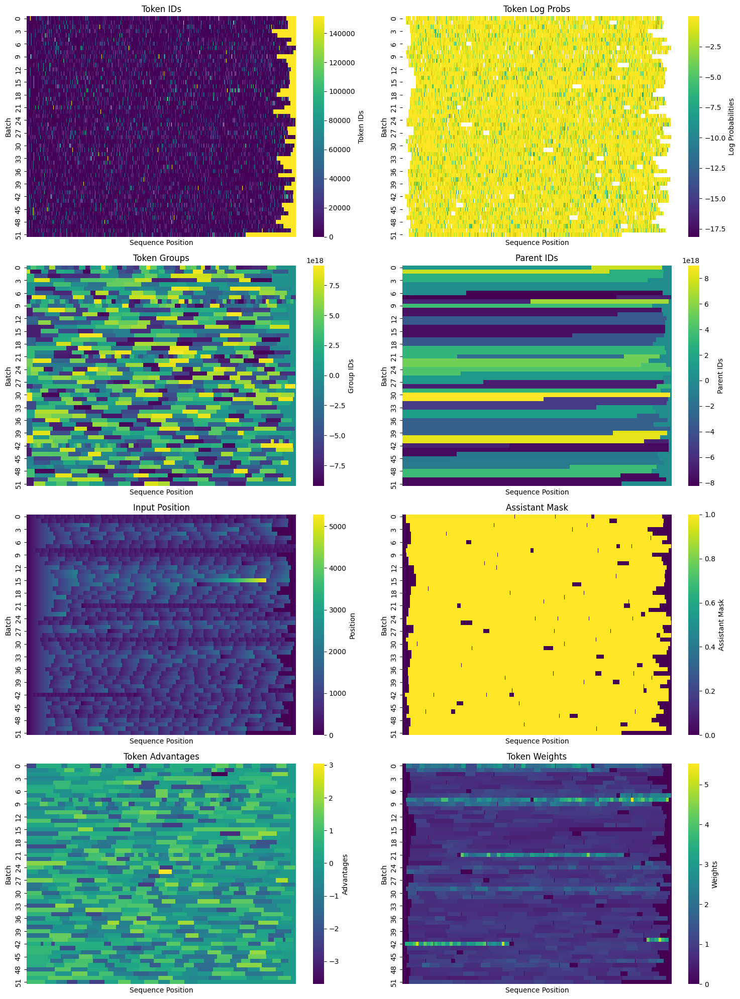

rsyncing /dev/shm/models/031 to /dev/shm/models/031
Download complete. Moving file to /home/gcpuser/.cache/huggingface/hub/models--Qwen--Qwen2.5-14B-Instruct/blobs/a6344aac8c09253b3b630fb776ae94478aa0275b
Download complete. Moving file to /home/gcpuser/.cache/huggingface/hub/models--Qwen--Qwen2.5-14B-Instruct/blobs/6634c8cc3133b3848ec74b9f275acaaa1ea618ab
Download complete. Moving file to /home/gcpuser/.cache/huggingface/hub/models--Qwen--Qwen2.5-14B-Instruct/blobs/cdb53558f3d3871db6823dd95ecac029044757a0
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 16:06:34.192000 13097 torch/distributed/run.py:793] 
W0221 16:06:34.192000 13097 torch/distributed/run.py:793] *****************************************
W0221 16:06:34.192000 13097 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 16:06:34.192000 13097 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: /home/gcpuser/.cache/huggingface/hub/models--Qwen--Qwen2.5-14B-Instruct/snapshots/cf98f3b3bbb457ad9e2bb7baf9a

Writing logs to models/031/logs/log_1740153999.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.03 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|13|Loss: 0.0002: 100%|██████████| 13/13 [08:03<00:00, 35.81s/it, entropy=0.646, kl_div=nan, loss=0.000186, policy=0.000186]   INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.52 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #1 model files to ./models/031/0001
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0001 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0001 --port=8000 --api-key=default
INFO 02-21 16:16:07 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 16:16:08 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 16:16:08 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0001', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=No

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.52s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.61s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.63s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.64s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.62s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.66s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.67s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.15s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.44s/it]



(VllmWorkerProcess pid=15904) INFO 02-21 16:16:42 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 16:16:42 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=15904) INFO 02-21 16:16:45 worker.py:267] Memory profiling takes 2.24 seconds
(VllmWorkerProcess pid=15904) INFO 02-21 16:16:45 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=15904) INFO 02-21 16:16:45 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 16:16:45 worker.py:267] Memory profiling takes 2.50 seconds
INFO 02-21 16:16:45 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 16:16:45 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [15618]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 16:17:33 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:55700 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:22<00:00,  1.64it/s, completion_tokens=894, prompt_tokens=419, reward=0.493, token_logprobs=915722]


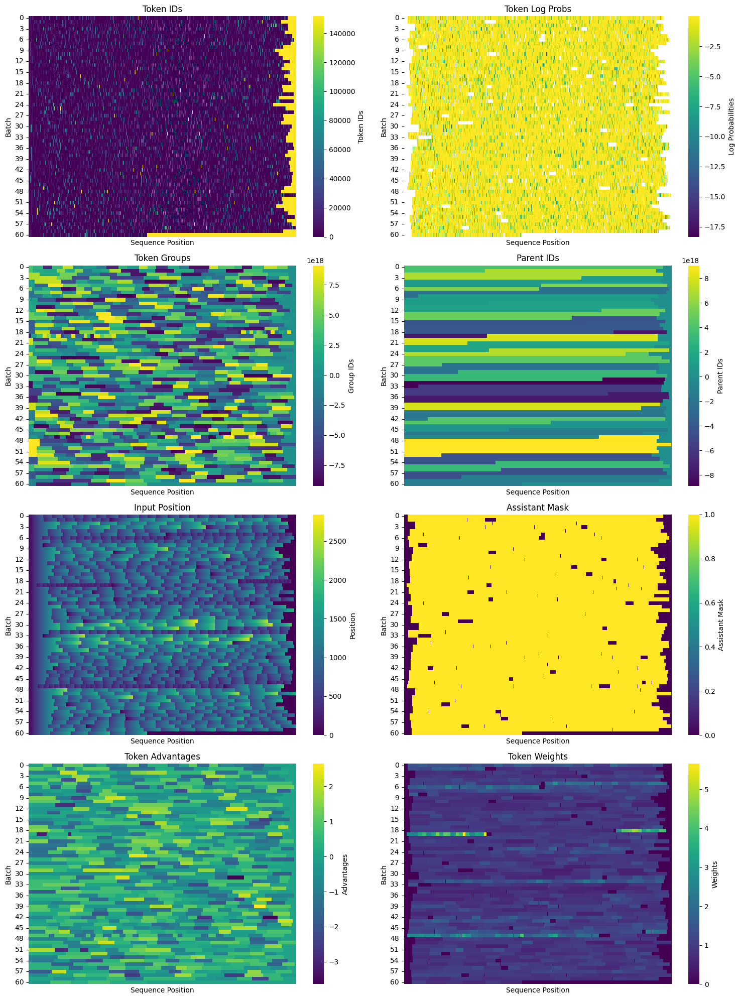

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 16:20:17.443000 16180 torch/distributed/run.py:793] 
W0221 16:20:17.443000 16180 torch/distributed/run.py:793] *****************************************
W0221 16:20:17.443000 16180 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 16:20:17.443000 16180 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0001
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740154822.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.05 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|15|Loss: 0.0000: 100%|██████████| 15/15 [09:15<00:00, 35.78s/it, entropy=0.726, kl_div=nan, loss=1.76e-5, policy=1.76e-5]     INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.53 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #2 model files to ./models/031/0002
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0002 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0002 --port=8000 --api-key=default
INFO 02-21 16:31:03 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 16:31:04 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 16:31:04 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0002', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=No

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.52s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.57s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.59s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.61s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.57s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.61s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.63s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.12s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.41s/it]



(VllmWorkerProcess pid=19030) INFO 02-21 16:31:39 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 16:31:39 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=19030) INFO 02-21 16:31:41 worker.py:267] Memory profiling takes 2.25 seconds
(VllmWorkerProcess pid=19030) INFO 02-21 16:31:41 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=19030) INFO 02-21 16:31:41 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 16:31:41 worker.py:267] Memory profiling takes 2.32 seconds
INFO 02-21 16:31:41 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 16:31:41 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [18743]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 16:32:34 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO 02-21 16:32:34 metrics.py:455] Avg prompt throughput: 4.7 tokens/s, Avg generation throughput: 0.2 tokens/s, Running: 0 reqs, Swapped: 0 reqs, Pending: 0 reqs, GPU KV cache usage: 0.0%, CPU KV cache usage: 0.0%.
INFO 02-21 16:32:34 metrics.py:471] Prefix cache hit rate: GPU: 0.00%, CPU: 0.00%
INFO:     127.0.0.1:41224 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:30<00:00,  1.22s/it, completion_tokens=897, prompt_tokens=412, reward=0.528, token_logprobs=918110]


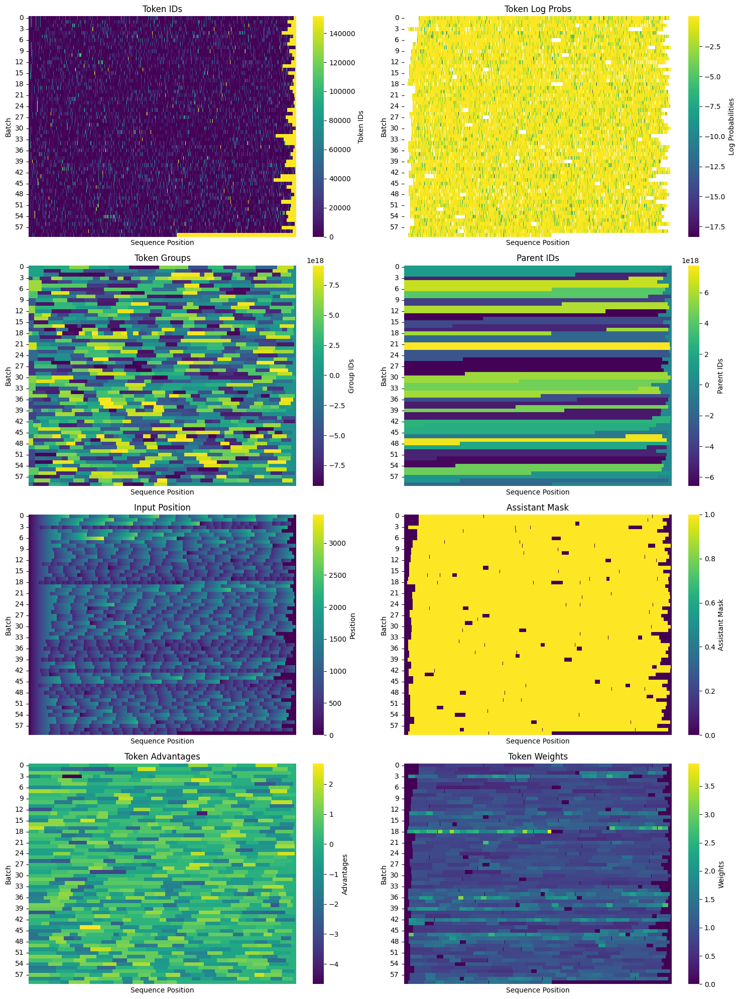

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 16:35:30.768000 19295 torch/distributed/run.py:793] 
W0221 16:35:30.768000 19295 torch/distributed/run.py:793] *****************************************
W0221 16:35:30.768000 19295 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 16:35:30.768000 19295 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0002
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740155735.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 24.81 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|15|Loss: -0.0002: 100%|██████████| 15/15 [09:14<00:00, 35.61s/it, entropy=0.58, kl_div=nan, loss=-0.000205, policy=-0.000205]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.22 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB s

Saved iteration #3 model files to ./models/031/0003
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0003 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0003 --port=8000 --api-key=default
INFO 02-21 16:46:12 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 16:46:13 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 16:46:13 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0003', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=No

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.54s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.58s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.60s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.59s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.57s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.58s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.58s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.08s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.38s/it]



(VllmWorkerProcess pid=21670) INFO 02-21 16:46:46 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 16:46:46 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=21670) INFO 02-21 16:46:48 worker.py:267] Memory profiling takes 2.15 seconds
(VllmWorkerProcess pid=21670) INFO 02-21 16:46:48 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=21670) INFO 02-21 16:46:48 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 16:46:49 worker.py:267] Memory profiling takes 2.25 seconds
INFO 02-21 16:46:49 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 16:46:49 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [21385]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 16:47:34 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:60346 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:37<00:00,  3.95s/it, completion_tokens=872, prompt_tokens=384, reward=0.566, token_logprobs=893000]
Deleted iteration directory ./models/031/0001


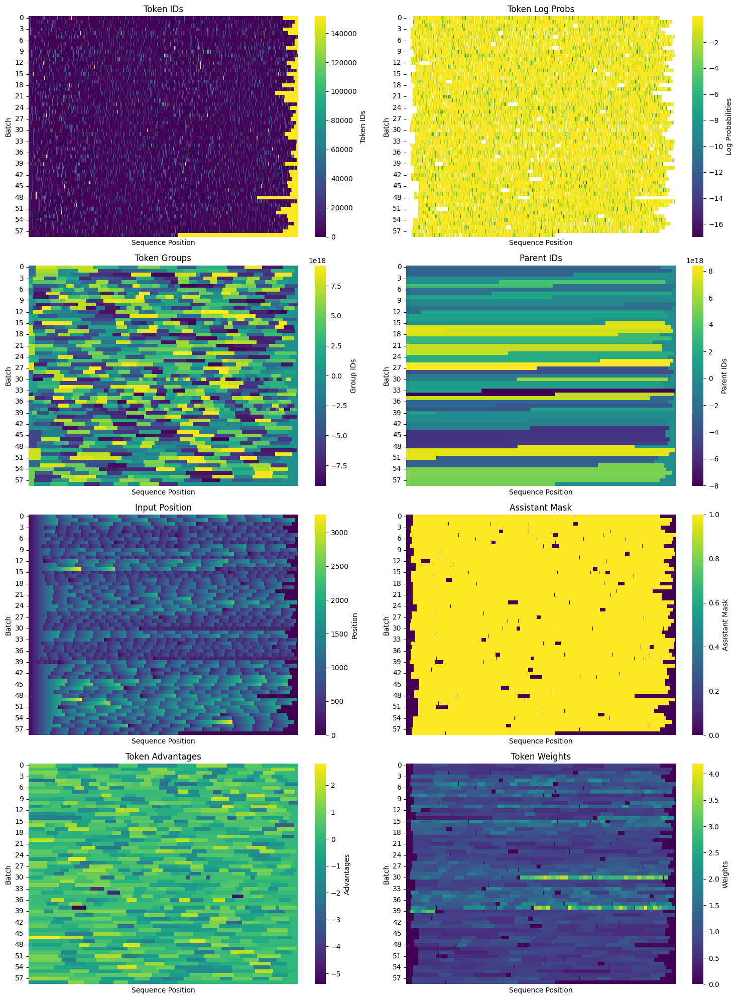

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 16:50:33.661000 21970 torch/distributed/run.py:793] 
W0221 16:50:33.661000 21970 torch/distributed/run.py:793] *****************************************
W0221 16:50:33.661000 21970 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 16:50:33.661000 21970 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0003
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740156638.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 24.11 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|15|Loss: -0.0021: 100%|██████████| 15/15 [09:10<00:00, 35.53s/it, entropy=0.574, kl_div=nan, loss=-0.00207, policy=-0.00207]  INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.11 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #4 model files to ./models/031/0004
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0004 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0004 --port=8000 --api-key=default
INFO 02-21 17:01:10 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 17:01:11 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 17:01:11 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0004', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=No

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:16,  2.41s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:04<00:15,  2.50s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.56s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.58s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.56s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.55s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:17<00:02,  2.55s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.05s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.35s/it]



(VllmWorkerProcess pid=25227) INFO 02-21 17:01:43 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 17:01:43 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=25227) INFO 02-21 17:01:45 worker.py:267] Memory profiling takes 2.07 seconds
(VllmWorkerProcess pid=25227) INFO 02-21 17:01:45 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=25227) INFO 02-21 17:01:45 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 17:01:45 worker.py:267] Memory profiling takes 2.30 seconds
INFO 02-21 17:01:45 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 17:01:45 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [24940]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 17:02:33 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:48146 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:20<00:00,  7.38it/s, completion_tokens=871, prompt_tokens=427, reward=0.56, token_logprobs=891625]
Deleted iteration directory ./models/031/0002


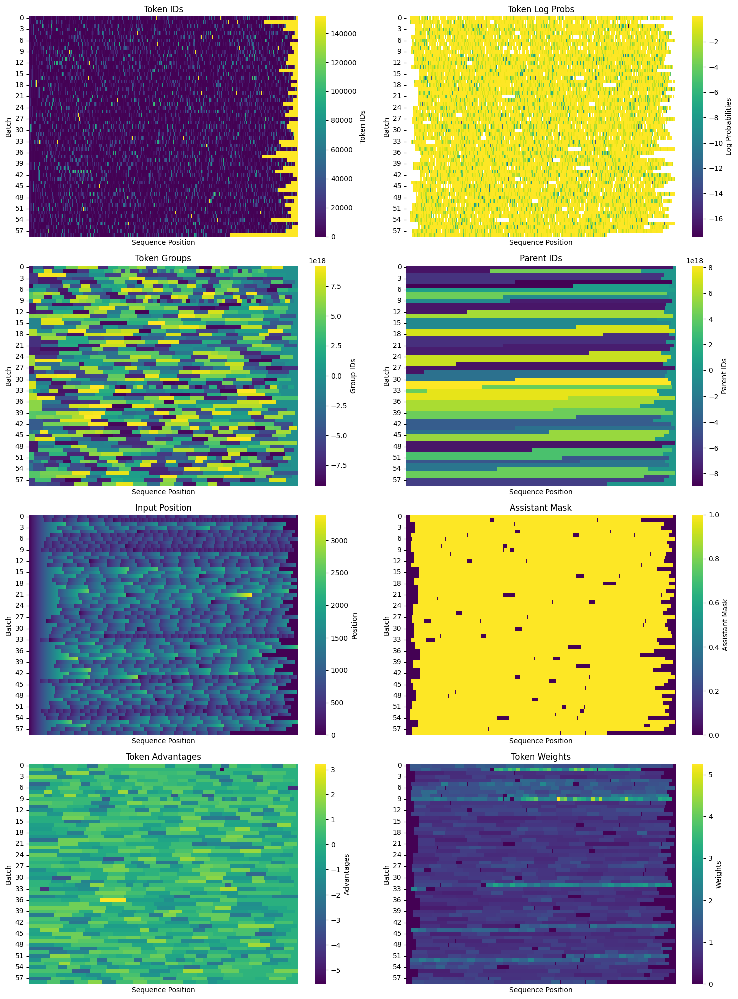

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 17:05:15.665000 25513 torch/distributed/run.py:793] 
W0221 17:05:15.665000 25513 torch/distributed/run.py:793] *****************************************
W0221 17:05:15.665000 25513 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 17:05:15.665000 25513 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0004
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740157520.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 24.04 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|15|Loss: -0.0016: 100%|██████████| 15/15 [09:11<00:00, 35.54s/it, entropy=0.64, kl_div=nan, loss=-0.00157, policy=-0.00157] INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.09 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB sa

Saved iteration #5 model files to ./models/031/0005
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0005 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0005 --port=8000 --api-key=default
INFO 02-21 17:15:52 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 17:15:52 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 17:15:52 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0005', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=No

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:16,  2.42s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:04<00:14,  2.49s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.52s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.54s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.52s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.53s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:17<00:02,  2.54s/it]


(VllmWorkerProcess pid=27997) INFO 02-21 17:16:24 model_runner.py:1115] Loading model weights took 13.9281 GB


Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.04s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.33s/it]



INFO 02-21 17:16:24 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=27997) INFO 02-21 17:16:27 worker.py:267] Memory profiling takes 2.06 seconds
(VllmWorkerProcess pid=27997) INFO 02-21 17:16:27 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=27997) INFO 02-21 17:16:27 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 17:16:27 worker.py:267] Memory profiling takes 2.28 seconds
INFO 02-21 17:16:27 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 17:16:27 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; PyTorch activation peak memory takes 5.70GiB; the rest of the memory reserved for KV Cache is 53.71GiB.
INFO 02-

INFO:     Started server process [27712]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 17:17:14 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:51334 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:43<00:00,  3.40it/s, completion_tokens=927, prompt_tokens=458, reward=0.504, token_logprobs=949253]
Deleted iteration directory ./models/031/0004


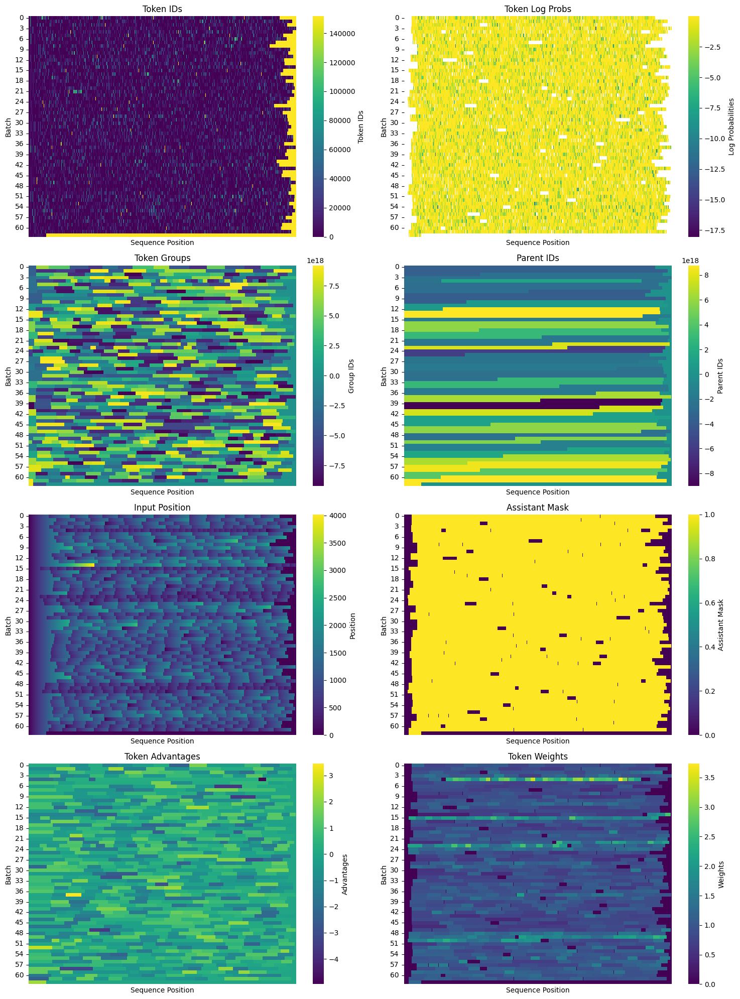

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 17:20:19.881000 28265 torch/distributed/run.py:793] 
W0221 17:20:19.881000 28265 torch/distributed/run.py:793] *****************************************
W0221 17:20:19.881000 28265 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 17:20:19.881000 28265 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0005
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740158424.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 24.30 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|16|Loss: -0.0032: 100%|██████████| 16/16 [09:47<00:00, 35.68s/it, entropy=0.79, kl_div=nan, loss=-0.00325, policy=-0.00325]   INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 16.93 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #6 model files to ./models/031/0006
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0006 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0006 --port=8000 --api-key=default
INFO 02-21 17:31:33 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 17:31:33 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 17:31:33 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0006', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=No

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.46s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:04<00:14,  2.49s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.51s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.53s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.52s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.54s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:17<00:02,  2.55s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.05s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.34s/it]



INFO 02-21 17:32:06 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=31347) INFO 02-21 17:32:06 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=31347) INFO 02-21 17:32:08 worker.py:267] Memory profiling takes 2.15 seconds
(VllmWorkerProcess pid=31347) INFO 02-21 17:32:08 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=31347) INFO 02-21 17:32:08 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 17:32:08 worker.py:267] Memory profiling takes 2.24 seconds
INFO 02-21 17:32:08 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 17:32:08 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [31062]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 17:32:53 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:54976 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

val: 100%|██████████| 128/128 [03:15<00:00, 12.49s/it, completion_tokens=932, prompt_tokens=424, reward=0.575, token_logprobs=119334]
Deleted iteration directory ./models/031/0003


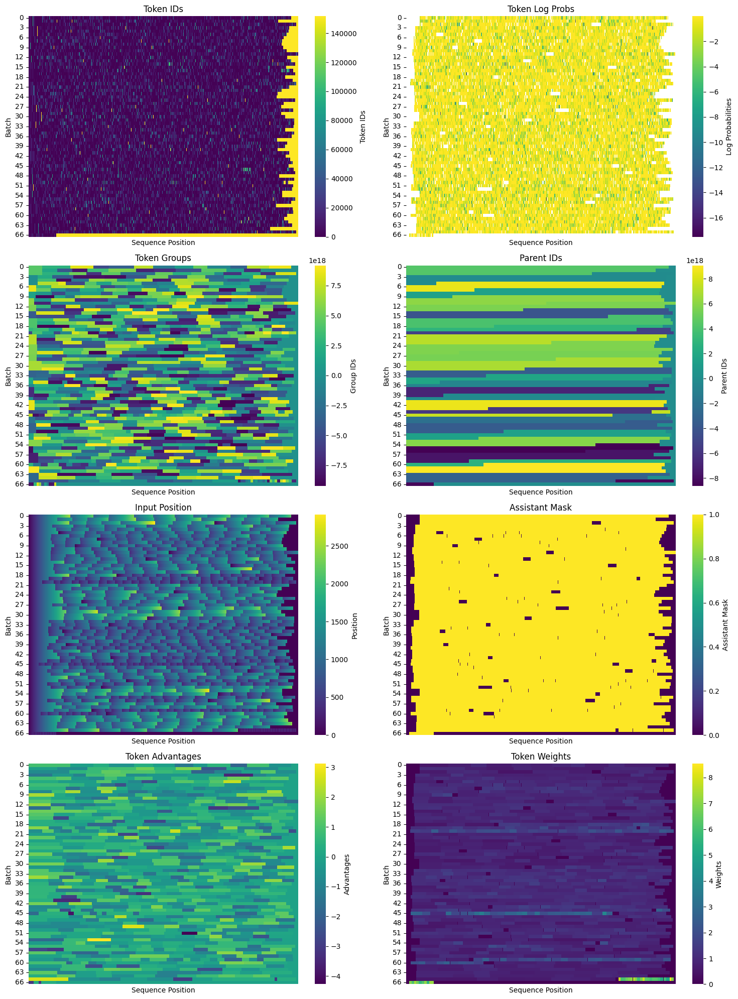

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 17:36:32.700000 31613 torch/distributed/run.py:793] 
W0221 17:36:32.700000 31613 torch/distributed/run.py:793] *****************************************
W0221 17:36:32.700000 31613 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 17:36:32.700000 31613 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0006
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740159397.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 23.17 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|17|Loss: -0.0084: 100%|██████████| 17/17 [10:22<00:00, 35.57s/it, entropy=0.643, kl_div=nan, loss=-0.0084, policy=-0.0084]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.25 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB save

Saved iteration #7 model files to ./models/031/0007
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0007 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0007 --port=8000 --api-key=default
INFO 02-21 17:48:20 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 17:48:20 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 17:48:20 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0007', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=No

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:16,  2.42s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:04<00:14,  2.49s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.53s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.56s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.54s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.54s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:17<00:02,  2.54s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.04s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.34s/it]



INFO 02-21 17:48:53 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=34273) INFO 02-21 17:48:53 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=34273) INFO 02-21 17:48:55 worker.py:267] Memory profiling takes 2.19 seconds
(VllmWorkerProcess pid=34273) INFO 02-21 17:48:55 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=34273) INFO 02-21 17:48:55 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 17:48:55 worker.py:267] Memory profiling takes 2.24 seconds
INFO 02-21 17:48:55 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 17:48:55 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [33986]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 17:49:42 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:54176 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:30<00:00,  3.11s/it, completion_tokens=828, prompt_tokens=379, reward=0.603, token_logprobs=848021]
Deleted iteration directory ./models/031/0006


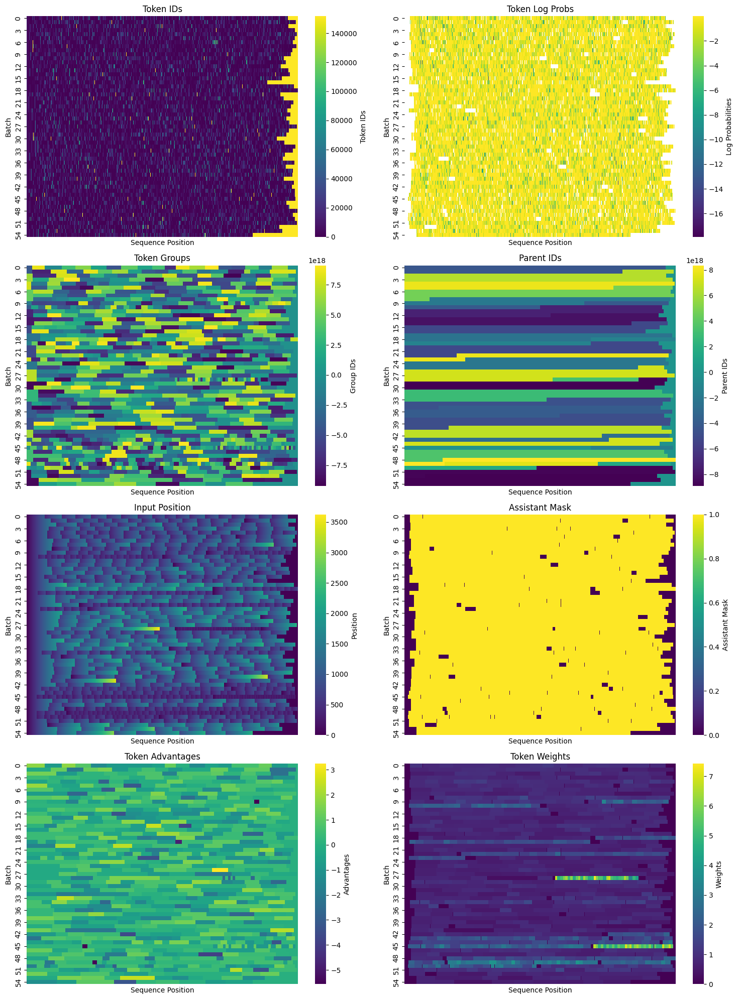

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 17:52:34.000000 35002 torch/distributed/run.py:793] 
W0221 17:52:34.000000 35002 torch/distributed/run.py:793] *****************************************
W0221 17:52:34.000000 35002 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 17:52:34.000000 35002 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0007
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740160358.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 23.96 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|14|Loss: -0.0009: 100%|██████████| 14/14 [08:37<00:00, 35.65s/it, entropy=0.655, kl_div=nan, loss=-0.000891, policy=-0.000891]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.02 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #8 model files to ./models/031/0008
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0008 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0008 --port=8000 --api-key=default
INFO 02-21 18:02:36 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 18:02:37 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 18:02:37 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0008', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=No

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.46s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.52s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.54s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.56s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.55s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.56s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:17<00:02,  2.57s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.06s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.36s/it]



(VllmWorkerProcess pid=37783) INFO 02-21 18:03:10 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 18:03:10 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=37783) INFO 02-21 18:03:12 worker.py:267] Memory profiling takes 2.17 seconds
(VllmWorkerProcess pid=37783) INFO 02-21 18:03:12 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=37783) INFO 02-21 18:03:12 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 18:03:12 worker.py:267] Memory profiling takes 2.31 seconds
INFO 02-21 18:03:12 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 18:03:12 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [37498]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 18:04:00 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:51702 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:24<00:00,  2.92s/it, completion_tokens=803, prompt_tokens=403, reward=0.605, token_logprobs=822185]
Deleted iteration directory ./models/031/0005


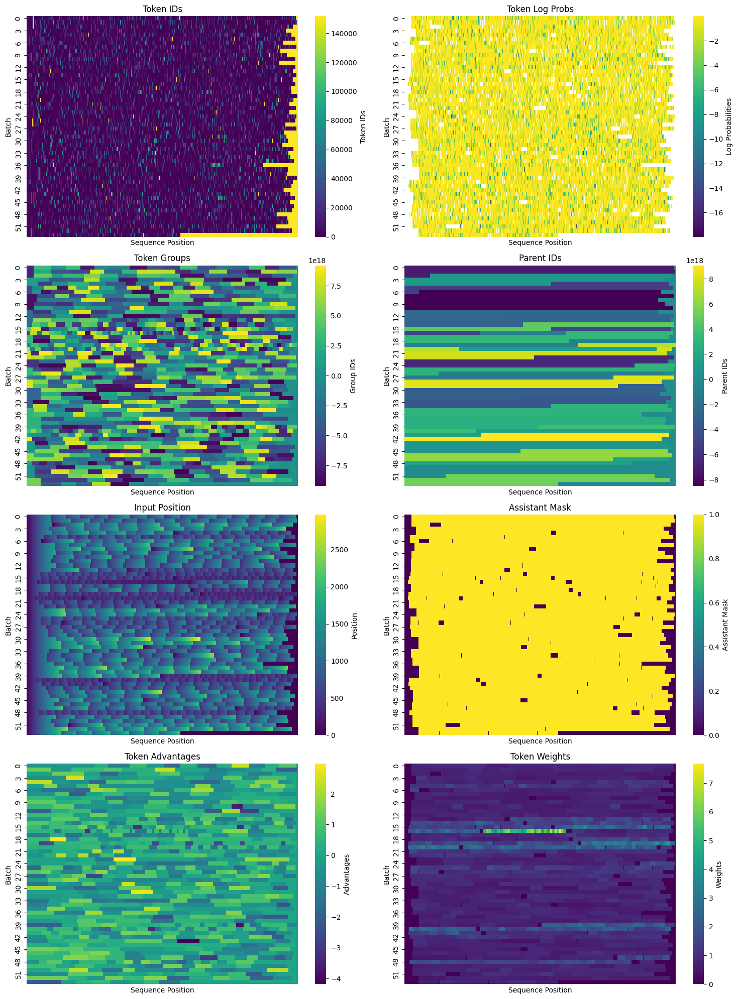

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 18:06:46.434000 38054 torch/distributed/run.py:793] 
W0221 18:06:46.434000 38054 torch/distributed/run.py:793] *****************************************
W0221 18:06:46.434000 38054 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 18:06:46.434000 38054 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0008
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740161211.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 24.48 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|13|Loss: -0.0004: 100%|██████████| 13/13 [08:01<00:00, 35.71s/it, entropy=0.606, kl_div=nan, loss=-0.000357, policy=-0.000357]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.23 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #9 model files to ./models/031/0009
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0009 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0009 --port=8000 --api-key=default
INFO 02-21 18:16:15 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 18:16:15 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 18:16:15 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0009', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=No

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.45s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.54s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.55s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.56s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.57s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.58s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:17<00:02,  2.59s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.08s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.37s/it]



(VllmWorkerProcess pid=40471) INFO 02-21 18:16:48 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 18:16:48 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=40471) INFO 02-21 18:16:51 worker.py:267] Memory profiling takes 2.15 seconds
(VllmWorkerProcess pid=40471) INFO 02-21 18:16:51 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=40471) INFO 02-21 18:16:51 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 18:16:51 worker.py:267] Memory profiling takes 2.24 seconds
INFO 02-21 18:16:51 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 18:16:51 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [40182]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 18:17:36 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:47074 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:21<00:00,  1.69s/it, completion_tokens=840, prompt_tokens=431, reward=0.599, token_logprobs=860134]
Deleted iteration directory ./models/031/0008


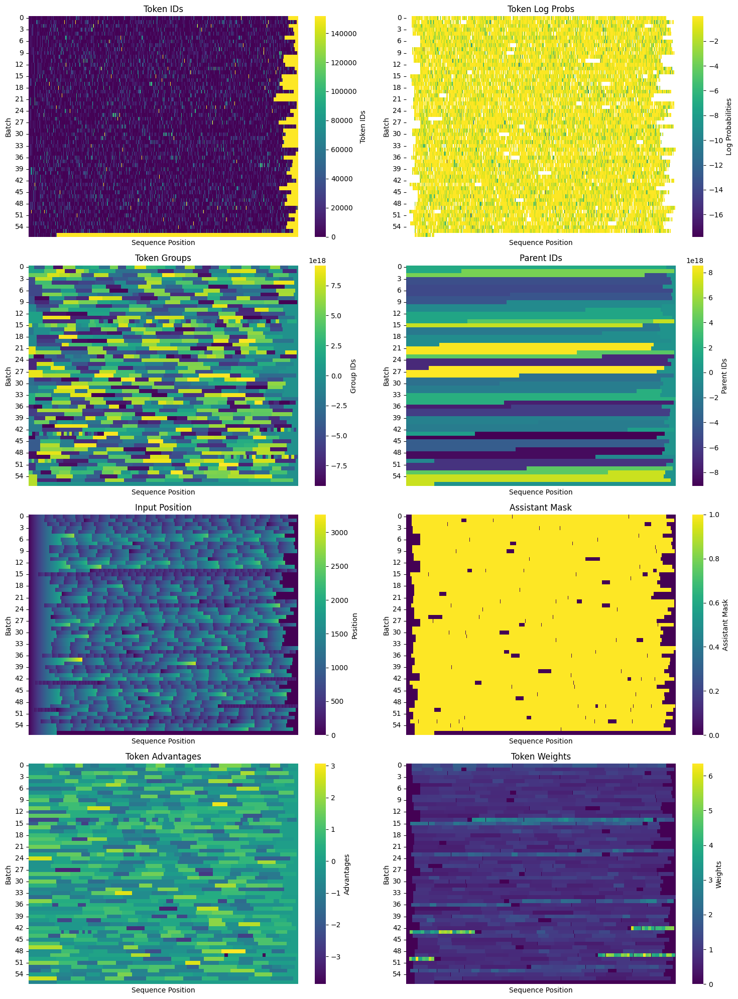

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 18:20:20.443000 40742 torch/distributed/run.py:793] 
W0221 18:20:20.443000 40742 torch/distributed/run.py:793] *****************************************
W0221 18:20:20.443000 40742 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 18:20:20.443000 40742 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0009
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740162025.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 24.57 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|14|Loss: -0.0011: 100%|██████████| 14/14 [08:36<00:00, 35.56s/it, entropy=0.602, kl_div=nan, loss=-0.00114, policy=-0.00114]  INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.06 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #10 model files to ./models/031/0010
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0010 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0010 --port=8000 --api-key=default
INFO 02-21 18:30:23 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 18:30:24 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 18:30:24 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0010', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.47s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.55s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.57s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.57s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.54s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.55s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:17<00:02,  2.55s/it]


(VllmWorkerProcess pid=43374) INFO 02-21 18:30:56 model_runner.py:1115] Loading model weights took 13.9281 GB


Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.05s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.36s/it]



INFO 02-21 18:30:57 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=43374) INFO 02-21 18:30:59 worker.py:267] Memory profiling takes 2.13 seconds
(VllmWorkerProcess pid=43374) INFO 02-21 18:30:59 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=43374) INFO 02-21 18:30:59 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 18:30:59 worker.py:267] Memory profiling takes 2.37 seconds
INFO 02-21 18:30:59 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 18:30:59 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; PyTorch activation peak memory takes 5.70GiB; the rest of the memory reserved for KV Cache is 53.71GiB.
INFO 02-

INFO:     Started server process [43089]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 18:31:45 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:49814 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:28<00:00,  2.41s/it, completion_tokens=828, prompt_tokens=403, reward=0.6, token_logprobs=847406]
Deleted iteration directory ./models/031/0009


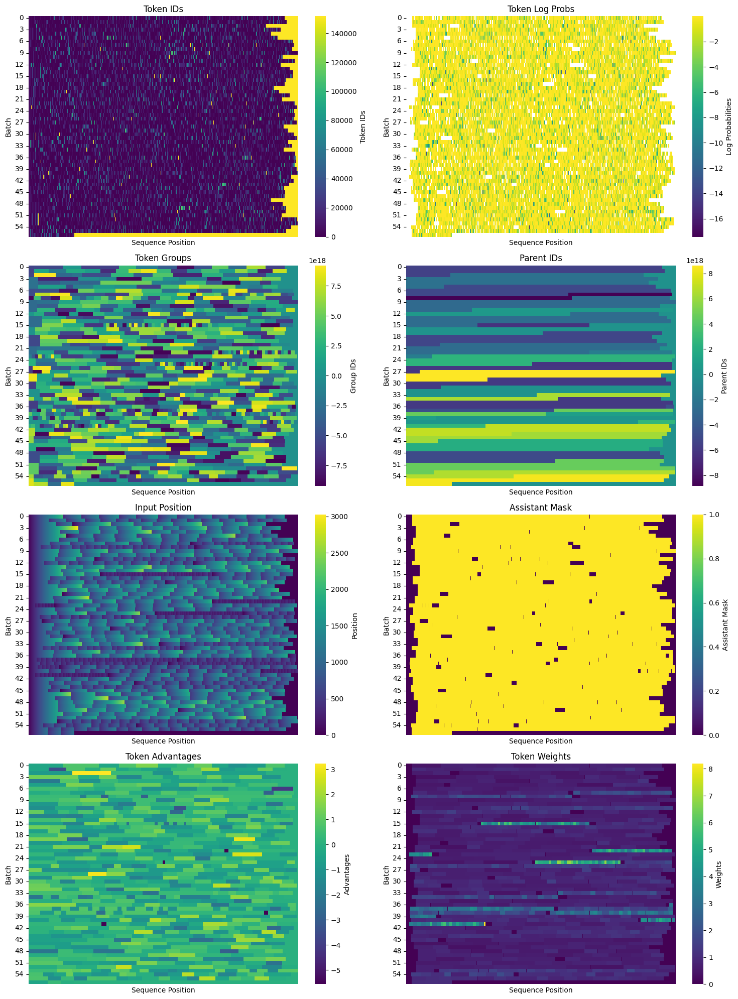

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 18:34:36.673000 44079 torch/distributed/run.py:793] 
W0221 18:34:36.673000 44079 torch/distributed/run.py:793] *****************************************
W0221 18:34:36.673000 44079 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 18:34:36.673000 44079 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0010
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740162881.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 23.83 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|14|Loss: -0.0002: 100%|██████████| 14/14 [08:37<00:00, 35.65s/it, entropy=0.801, kl_div=nan, loss=-0.000243, policy=-0.000243]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.50 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #11 model files to ./models/031/0011
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0011 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0011 --port=8000 --api-key=default
INFO 02-21 18:44:41 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 18:44:41 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 18:44:41 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0011', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.46s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.52s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.56s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.58s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.56s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.57s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:17<00:02,  2.58s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.08s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:18<00:00,  2.37s/it]



(VllmWorkerProcess pid=46803) INFO 02-21 18:45:14 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 18:45:15 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=46803) INFO 02-21 18:45:17 worker.py:267] Memory profiling takes 2.13 seconds
(VllmWorkerProcess pid=46803) INFO 02-21 18:45:17 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=46803) INFO 02-21 18:45:17 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 18:45:17 worker.py:267] Memory profiling takes 2.21 seconds
INFO 02-21 18:45:17 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 18:45:17 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [46518]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 18:46:05 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:53016 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:13<00:00,  1.09s/it, completion_tokens=789, prompt_tokens=384, reward=0.591, token_logprobs=807535]
Deleted iteration directory ./models/031/0010


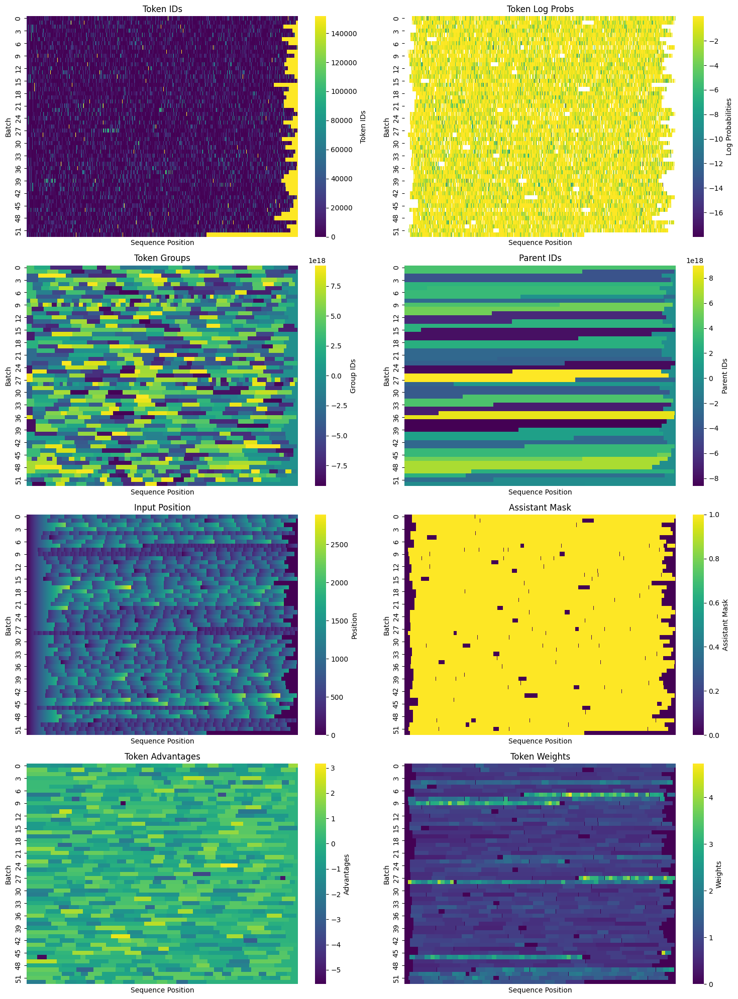

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 18:48:41.701000 47066 torch/distributed/run.py:793] 
W0221 18:48:41.701000 47066 torch/distributed/run.py:793] *****************************************
W0221 18:48:41.701000 47066 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 18:48:41.701000 47066 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0011
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740163726.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.05 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|13|Loss: -0.0001: 100%|██████████| 13/13 [08:03<00:00, 35.79s/it, entropy=0.831, kl_div=nan, loss=-0.000127, policy=-0.000127]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.62 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #12 model files to ./models/031/0012
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0012 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0012 --port=8000 --api-key=default
INFO 02-21 18:58:14 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 18:58:15 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 18:58:15 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0012', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.48s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.54s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.56s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.57s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.56s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.60s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.62s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.11s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.39s/it]



(VllmWorkerProcess pid=49808) INFO 02-21 18:58:49 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 18:58:49 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=49808) INFO 02-21 18:58:51 worker.py:267] Memory profiling takes 2.20 seconds
(VllmWorkerProcess pid=49808) INFO 02-21 18:58:51 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=49808) INFO 02-21 18:58:51 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 18:58:51 worker.py:267] Memory profiling takes 2.28 seconds
INFO 02-21 18:58:51 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 18:58:51 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [49518]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 18:59:38 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:37984 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:17<00:00,  1.35it/s, completion_tokens=831, prompt_tokens=376, reward=0.589, token_logprobs=850716]
Deleted iteration directory ./models/031/0011


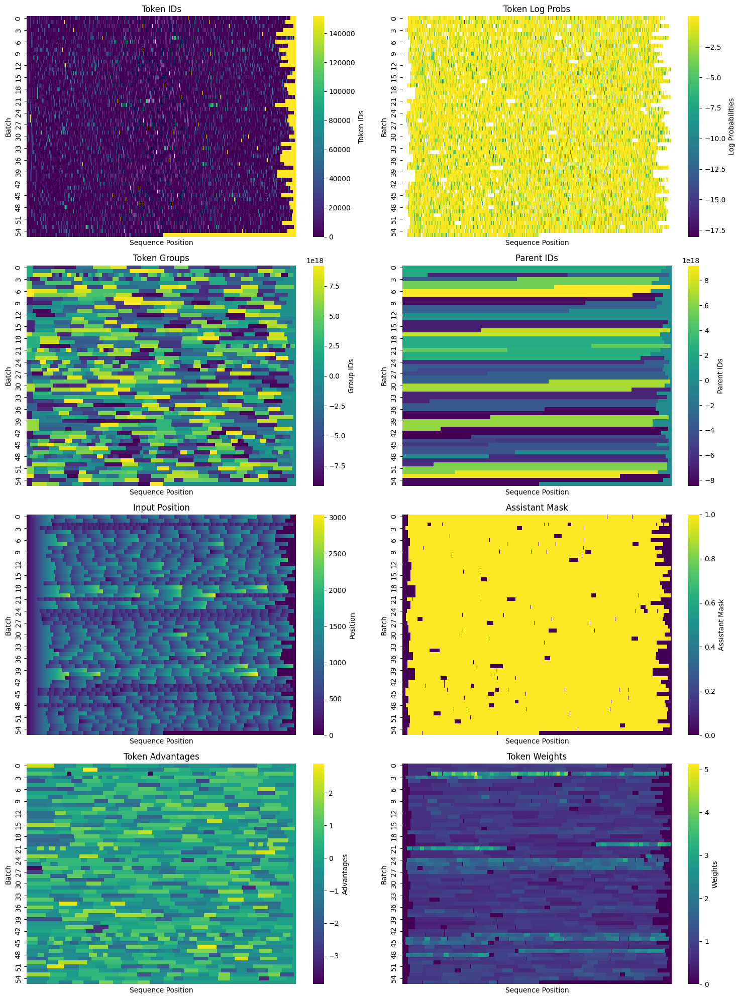

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 19:02:18.992000 50512 torch/distributed/run.py:793] 
W0221 19:02:18.992000 50512 torch/distributed/run.py:793] *****************************************
W0221 19:02:18.992000 50512 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 19:02:18.992000 50512 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0012
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740164543.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.13 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|14|Loss: 0.0001: 100%|██████████| 14/14 [08:40<00:00, 35.82s/it, entropy=0.661, kl_div=nan, loss=0.000113, policy=0.000113]   INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.65 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #13 model files to ./models/031/0013
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0013 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0013 --port=8000 --api-key=default
INFO 02-21 19:12:29 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 19:12:30 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 19:12:30 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0013', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:18,  2.61s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.65s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.67s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.68s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.66s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:16<00:05,  2.67s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.67s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.14s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.46s/it]



(VllmWorkerProcess pid=53223) INFO 02-21 19:13:05 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 19:13:05 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=53223) INFO 02-21 19:13:07 worker.py:267] Memory profiling takes 2.30 seconds
(VllmWorkerProcess pid=53223) INFO 02-21 19:13:07 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=53223) INFO 02-21 19:13:07 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 19:13:07 worker.py:267] Memory profiling takes 2.38 seconds
INFO 02-21 19:13:07 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 19:13:07 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [52934]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 19:13:57 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:49100 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:33<00:00,  2.49s/it, completion_tokens=880, prompt_tokens=400, reward=0.57, token_logprobs=900794]
Deleted iteration directory ./models/031/0012


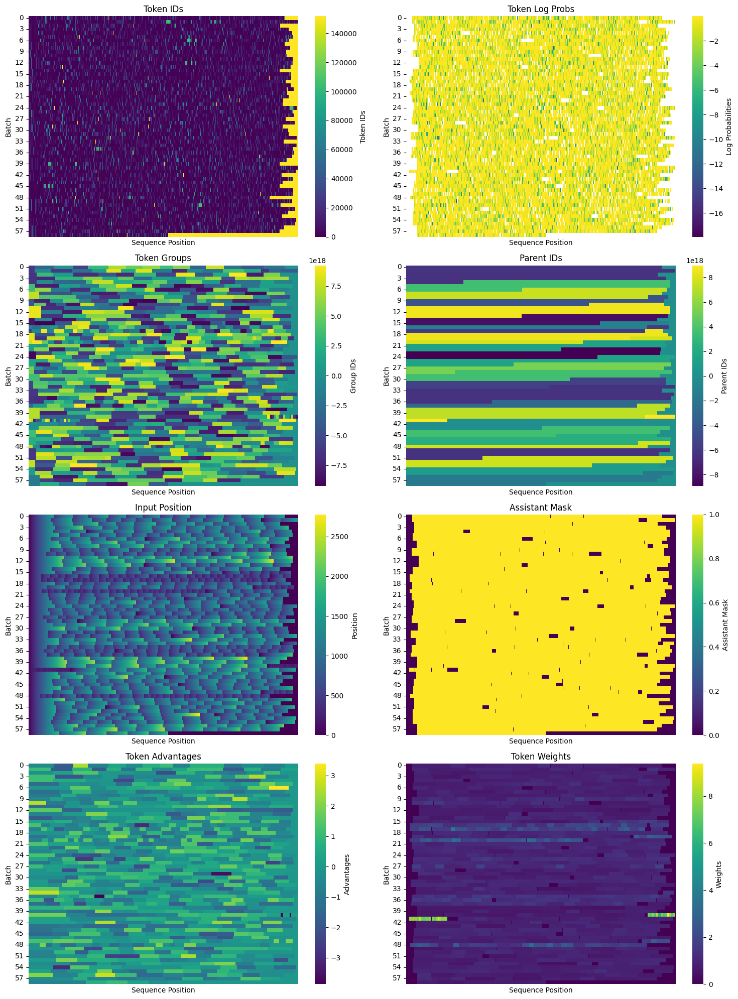

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 19:16:55.152000 53538 torch/distributed/run.py:793] 
W0221 19:16:55.152000 53538 torch/distributed/run.py:793] *****************************************
W0221 19:16:55.152000 53538 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 19:16:55.152000 53538 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0013
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740165420.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.24 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|15|Loss: -0.0020: 100%|██████████| 15/15 [09:15<00:00, 35.78s/it, entropy=0.713, kl_div=nan, loss=-0.00204, policy=-0.00204]  INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.75 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #14 model files to ./models/031/0014
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0014 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0014 --port=8000 --api-key=default
INFO 02-21 19:27:41 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 19:27:42 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 19:27:42 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0014', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.53s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.58s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.61s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.64s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.63s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.66s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.68s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.17s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.45s/it]



(VllmWorkerProcess pid=55910) INFO 02-21 19:28:17 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 19:28:17 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=55910) INFO 02-21 19:28:20 worker.py:267] Memory profiling takes 2.42 seconds
(VllmWorkerProcess pid=55910) INFO 02-21 19:28:20 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=55910) INFO 02-21 19:28:20 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 19:28:20 worker.py:267] Memory profiling takes 2.50 seconds
INFO 02-21 19:28:20 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 19:28:20 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [55618]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 19:29:08 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:52194 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:24<00:00,  1.23s/it, completion_tokens=855, prompt_tokens=423, reward=0.593, token_logprobs=875042]
Deleted iteration directory ./models/031/0013


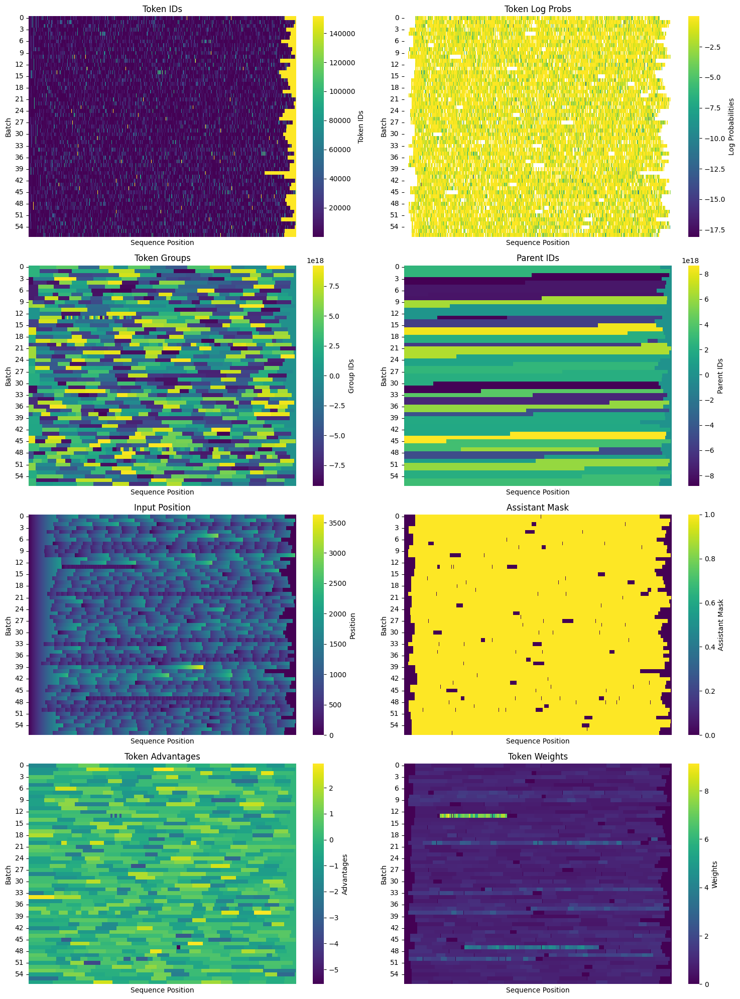

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 19:31:55.916000 56703 torch/distributed/run.py:793] 
W0221 19:31:55.916000 56703 torch/distributed/run.py:793] *****************************************
W0221 19:31:55.916000 56703 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 19:31:55.916000 56703 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0014
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740166320.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.02 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|14|Loss: -0.0002: 100%|██████████| 14/14 [08:40<00:00, 35.81s/it, entropy=0.678, kl_div=nan, loss=-0.000202, policy=-0.000202]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.71 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #15 model files to ./models/031/0015
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0015 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0015 --port=8000 --api-key=default
INFO 02-21 19:42:06 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 19:42:07 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 19:42:07 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0015', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.53s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.59s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.64s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.65s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.63s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.64s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.65s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.13s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.43s/it]



INFO 02-21 19:42:42 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=59782) INFO 02-21 19:42:42 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=59782) INFO 02-21 19:42:45 worker.py:267] Memory profiling takes 2.21 seconds
(VllmWorkerProcess pid=59782) INFO 02-21 19:42:45 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=59782) INFO 02-21 19:42:45 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 19:42:45 worker.py:267] Memory profiling takes 2.47 seconds
INFO 02-21 19:42:45 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 19:42:45 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [59491]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 19:43:34 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:43846 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:37<00:00,  2.48s/it, completion_tokens=766, prompt_tokens=382, reward=0.627, token_logprobs=784590]
Deleted iteration directory ./models/031/0014


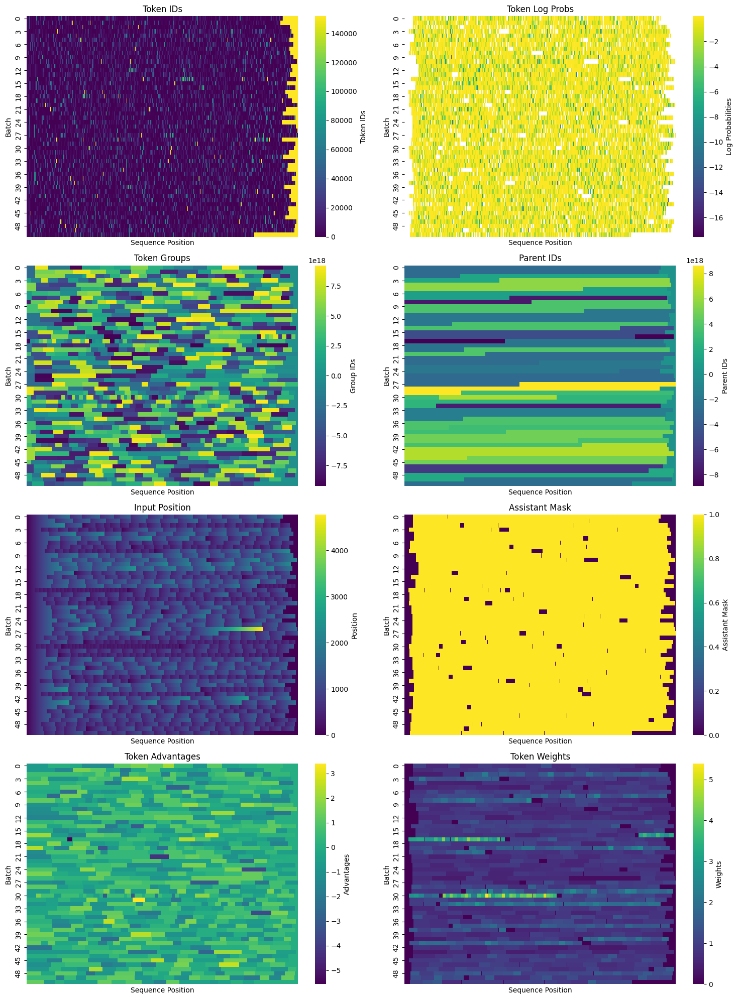

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 19:46:34.416000 60132 torch/distributed/run.py:793] 
W0221 19:46:34.416000 60132 torch/distributed/run.py:793] *****************************************
W0221 19:46:34.416000 60132 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 19:46:34.416000 60132 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0015
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740167199.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.14 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|13|Loss: -0.0076: 100%|██████████| 13/13 [08:04<00:00, 35.82s/it, entropy=0.824, kl_div=nan, loss=-0.00763, policy=-0.00763]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.69 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB sa

Saved iteration #16 model files to ./models/031/0016
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0016 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0016 --port=8000 --api-key=default
INFO 02-21 19:56:09 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 19:56:10 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 19:56:10 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0016', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.51s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.57s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:12,  2.60s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.64s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.62s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.64s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.65s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.14s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.43s/it]



(VllmWorkerProcess pid=62654) INFO 02-21 19:56:44 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 19:56:44 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=62654) INFO 02-21 19:56:47 worker.py:267] Memory profiling takes 2.23 seconds
(VllmWorkerProcess pid=62654) INFO 02-21 19:56:47 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=62654) INFO 02-21 19:56:47 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 19:56:47 worker.py:267] Memory profiling takes 2.49 seconds
INFO 02-21 19:56:47 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 19:56:47 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [62365]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 19:57:37 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:47028 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:02<00:00,  1.73it/s, completion_tokens=738, prompt_tokens=363, reward=0.664, token_logprobs=755217]
Deleted iteration directory ./models/031/0015


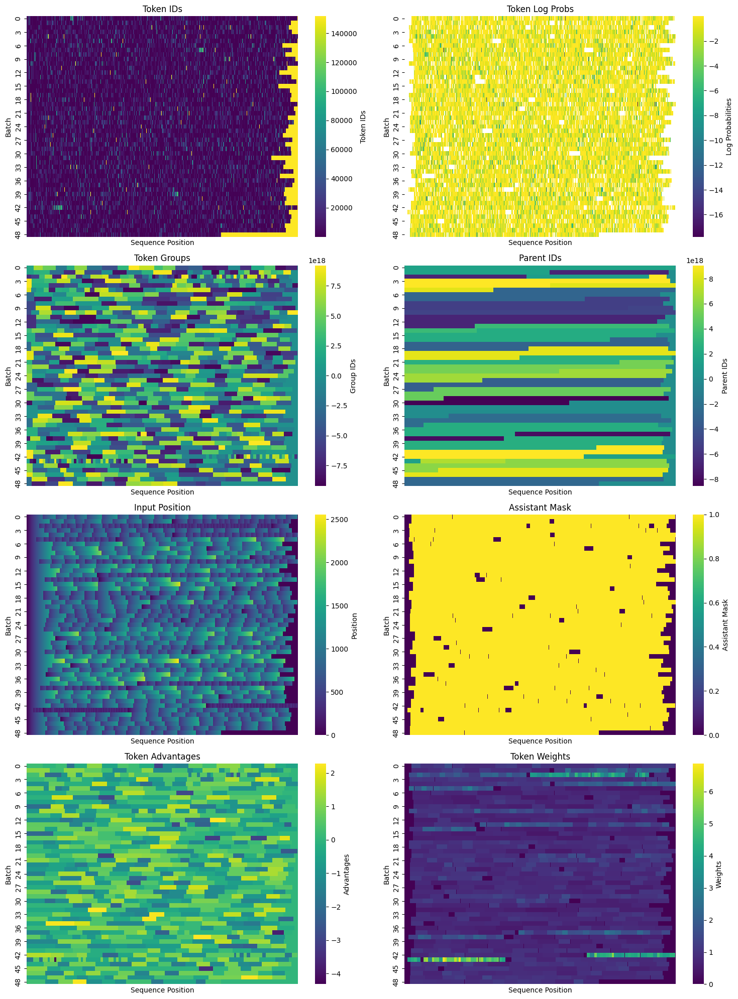

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 20:00:02.171000 62928 torch/distributed/run.py:793] 
W0221 20:00:02.171000 62928 torch/distributed/run.py:793] *****************************************
W0221 20:00:02.171000 62928 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 20:00:02.171000 62928 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0016
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740168007.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.19 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|12|Loss: 0.0003: 100%|██████████| 12/12 [07:28<00:00, 35.85s/it, entropy=0.667, kl_div=nan, loss=0.000259, policy=0.000259] INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.70 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB sa

Saved iteration #17 model files to ./models/031/0017
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0017 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0017 --port=8000 --api-key=default
INFO 02-21 20:09:01 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 20:09:02 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 20:09:02 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0017', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.53s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.60s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.62s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.66s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.66s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.66s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.65s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.13s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.44s/it]



(VllmWorkerProcess pid=65361) INFO 02-21 20:09:36 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 20:09:36 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=65361) INFO 02-21 20:09:39 worker.py:267] Memory profiling takes 2.45 seconds
(VllmWorkerProcess pid=65361) INFO 02-21 20:09:39 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=65361) INFO 02-21 20:09:39 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 20:09:39 worker.py:267] Memory profiling takes 2.54 seconds
INFO 02-21 20:09:39 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 20:09:39 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [65076]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 20:10:29 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:38108 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:14<00:00,  2.56s/it, completion_tokens=752, prompt_tokens=358, reward=0.659, token_logprobs=770039]
Deleted iteration directory ./models/031/0016


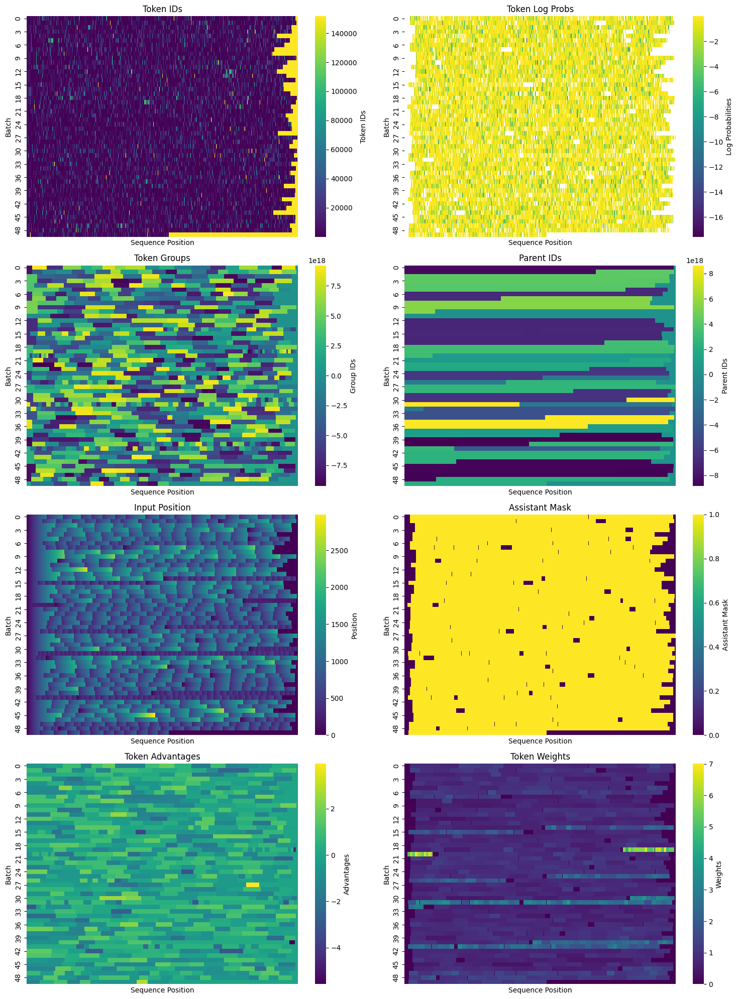

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 20:13:05.196000 66048 torch/distributed/run.py:793] 
W0221 20:13:05.196000 66048 torch/distributed/run.py:793] *****************************************
W0221 20:13:05.196000 66048 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 20:13:05.196000 66048 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0017
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740168790.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.14 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|12|Loss: -0.0001: 100%|██████████| 12/12 [07:28<00:00, 35.86s/it, entropy=0.619, kl_div=nan, loss=-7.09e-5, policy=-7.09e-5] INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.55 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB s

Saved iteration #18 model files to ./models/031/0018
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0018 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0018 --port=8000 --api-key=default
INFO 02-21 20:22:04 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 20:22:05 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 20:22:05 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0018', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.52s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.58s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.63s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.64s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.62s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.63s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.64s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.12s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.43s/it]



INFO 02-21 20:22:40 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=68451) INFO 02-21 20:22:40 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=68451) INFO 02-21 20:22:42 worker.py:267] Memory profiling takes 2.28 seconds
(VllmWorkerProcess pid=68451) INFO 02-21 20:22:42 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=68451) INFO 02-21 20:22:42 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 20:22:42 worker.py:267] Memory profiling takes 2.35 seconds
INFO 02-21 20:22:42 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 20:22:42 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [68165]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 20:23:31 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:59470 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:31<00:00,  4.69s/it, completion_tokens=767, prompt_tokens=377, reward=0.657, token_logprobs=785009]
Deleted iteration directory ./models/031/0017


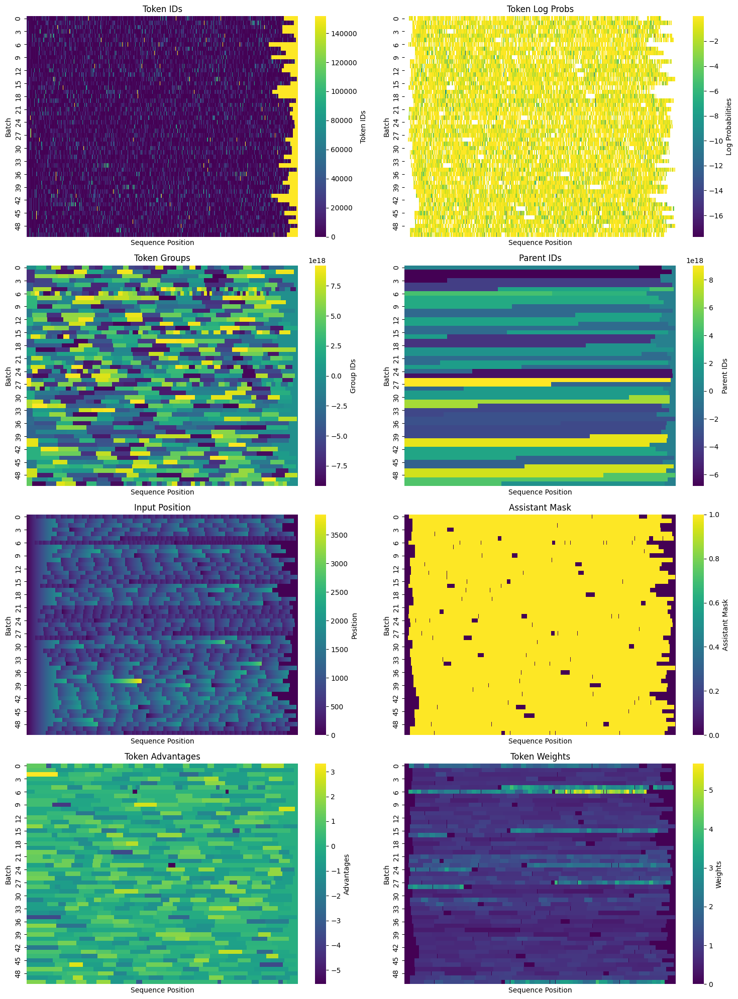

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 20:26:24.887000 68716 torch/distributed/run.py:793] 
W0221 20:26:24.887000 68716 torch/distributed/run.py:793] *****************************************
W0221 20:26:24.887000 68716 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 20:26:24.887000 68716 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0018
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740169589.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.26 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|13|Loss: -0.0021: 100%|██████████| 13/13 [08:04<00:00, 35.82s/it, entropy=0.447, kl_div=nan, loss=-0.00207, policy=-0.00207]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.64 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB sa

Saved iteration #19 model files to ./models/031/0019
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0019 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0019 --port=8000 --api-key=default
INFO 02-21 20:36:00 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 20:36:00 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 20:36:00 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0019', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.54s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.61s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.63s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.65s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.64s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.66s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.67s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.15s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.45s/it]



(VllmWorkerProcess pid=71157) INFO 02-21 20:36:35 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 20:36:35 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=71157) INFO 02-21 20:36:38 worker.py:267] Memory profiling takes 2.29 seconds
(VllmWorkerProcess pid=71157) INFO 02-21 20:36:38 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=71157) INFO 02-21 20:36:38 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 20:36:38 worker.py:267] Memory profiling takes 2.38 seconds
INFO 02-21 20:36:38 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 20:36:38 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [70872]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 20:37:27 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:48102 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:15<00:00,  3.14s/it, completion_tokens=696, prompt_tokens=376, reward=0.643, token_logprobs=713208]
Deleted iteration directory ./models/031/0018


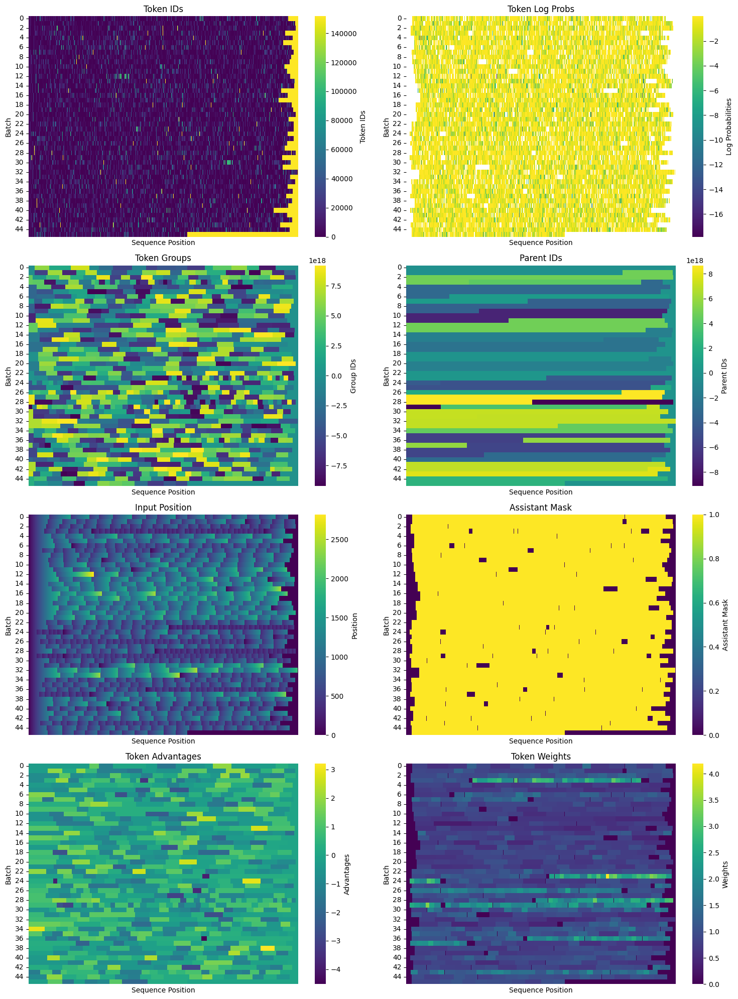

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 20:40:05.689000 71429 torch/distributed/run.py:793] 
W0221 20:40:05.689000 71429 torch/distributed/run.py:793] *****************************************
W0221 20:40:05.689000 71429 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 20:40:05.689000 71429 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0019
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740170410.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 24.21 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|11|Loss: 0.0005: 100%|██████████| 11/11 [06:53<00:00, 35.90s/it, entropy=0.664, kl_div=nan, loss=0.000492, policy=0.000492]   INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.69 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #20 model files to ./models/031/0020
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0020 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0020 --port=8000 --api-key=default
INFO 02-21 20:48:28 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 20:48:29 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 20:48:29 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0020', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:18,  2.58s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.64s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.64s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.65s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.65s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.66s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.66s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.14s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.45s/it]



(VllmWorkerProcess pid=73794) INFO 02-21 20:49:04 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 20:49:04 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=73794) INFO 02-21 20:49:06 worker.py:267] Memory profiling takes 2.26 seconds
(VllmWorkerProcess pid=73794) INFO 02-21 20:49:06 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=73794) INFO 02-21 20:49:06 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 20:49:07 worker.py:267] Memory profiling takes 2.54 seconds
INFO 02-21 20:49:07 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 20:49:07 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [73509]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 20:49:55 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:36970 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:03<00:00,  1.22s/it, completion_tokens=686, prompt_tokens=360, reward=0.669, token_logprobs=702320]
Deleted iteration directory ./models/031/0019


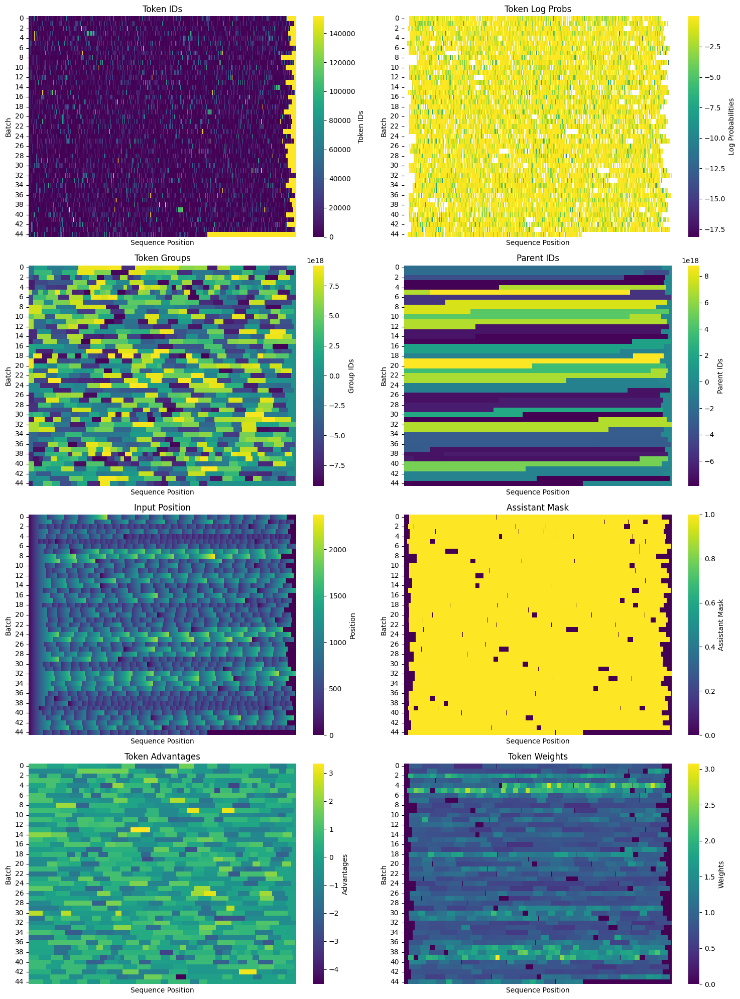

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 20:52:20.485000 74476 torch/distributed/run.py:793] 
W0221 20:52:20.485000 74476 torch/distributed/run.py:793] *****************************************
W0221 20:52:20.485000 74476 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 20:52:20.485000 74476 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0020
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740171145.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 23.91 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|11|Loss: 0.0003: 100%|██████████| 11/11 [06:52<00:00, 35.92s/it, entropy=0.572, kl_div=nan, loss=0.000256, policy=0.000256]   INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.98 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #21 model files to ./models/031/0021
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0021 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0021 --port=8000 --api-key=default
INFO 02-21 21:00:43 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 21:00:44 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 21:00:44 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0021', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.50s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.58s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.61s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.63s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.60s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.62s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.62s/it]


(VllmWorkerProcess pid=77247) INFO 02-21 21:01:18 model_runner.py:1115] Loading model weights took 13.9281 GB


Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.11s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.41s/it]



INFO 02-21 21:01:18 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=77247) INFO 02-21 21:01:21 worker.py:267] Memory profiling takes 2.23 seconds
(VllmWorkerProcess pid=77247) INFO 02-21 21:01:21 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=77247) INFO 02-21 21:01:21 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 21:01:21 worker.py:267] Memory profiling takes 2.50 seconds
INFO 02-21 21:01:21 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 21:01:21 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; PyTorch activation peak memory takes 5.70GiB; the rest of the memory reserved for KV Cache is 53.71GiB.
INFO 02-

INFO:     Started server process [76962]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 21:02:08 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:55258 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:23<00:00,  1.47s/it, completion_tokens=839, prompt_tokens=426, reward=0.596, token_logprobs=859359]
Deleted iteration directory ./models/031/0020


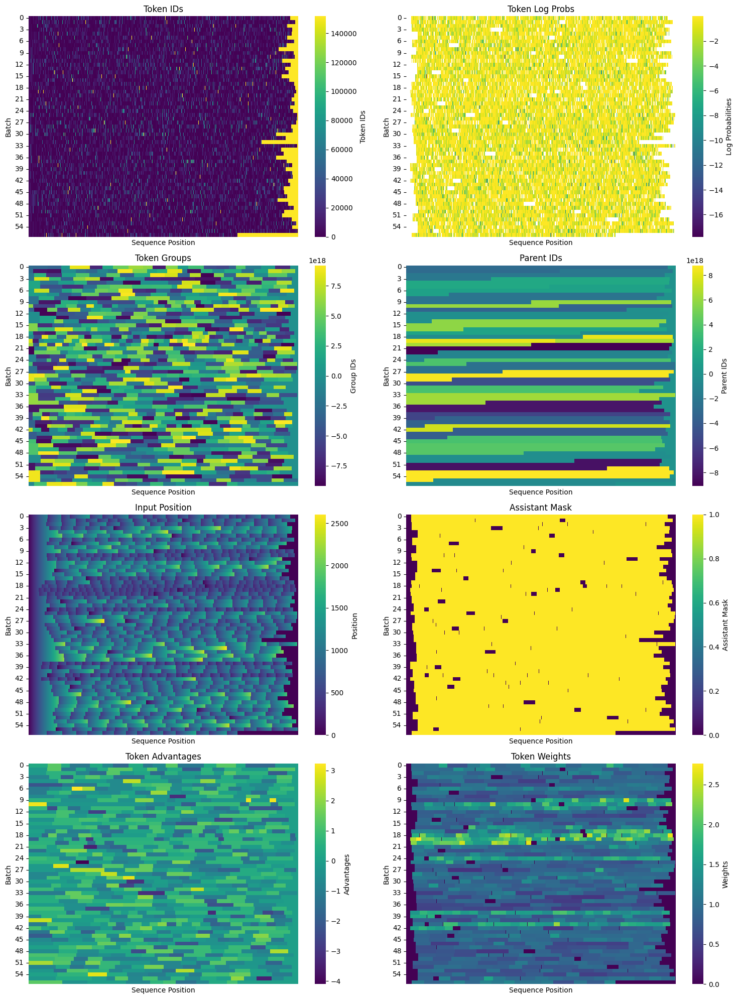

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 21:04:55.517000 77504 torch/distributed/run.py:793] 
W0221 21:04:55.517000 77504 torch/distributed/run.py:793] *****************************************
W0221 21:04:55.517000 77504 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 21:04:55.517000 77504 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0021
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740171900.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.12 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|14|Loss: 0.0002: 100%|██████████| 14/14 [08:39<00:00, 35.80s/it, entropy=0.611, kl_div=nan, loss=0.000197, policy=0.000197]   INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.85 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #22 model files to ./models/031/0022
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0022 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0022 --port=8000 --api-key=default
INFO 02-21 21:15:06 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 21:15:07 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 21:15:07 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0022', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.55s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.63s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.66s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.67s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.66s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.68s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.69s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.16s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.46s/it]



(VllmWorkerProcess pid=79867) INFO 02-21 21:15:42 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 21:15:42 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=79867) INFO 02-21 21:15:44 worker.py:267] Memory profiling takes 2.30 seconds
(VllmWorkerProcess pid=79867) INFO 02-21 21:15:44 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=79867) INFO 02-21 21:15:44 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 21:15:44 worker.py:267] Memory profiling takes 2.39 seconds
INFO 02-21 21:15:44 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 21:15:44 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [79582]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 21:16:37 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO 02-21 21:16:38 metrics.py:455] Avg prompt throughput: 4.5 tokens/s, Avg generation throughput: 0.2 tokens/s, Running: 0 reqs, Swapped: 0 reqs, Pending: 0 reqs, GPU KV cache usage: 0.0%, CPU KV cache usage: 0.0%.
INFO 02-21 21:16:38 metrics.py:471] Prefix cache hit rate: GPU: 0.00%, CPU: 0.00%
INFO:     127.0.0.1:43238 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:26<00:00,  1.92s/it, completion_tokens=859, prompt_tokens=421, reward=0.559, token_logprobs=880038]
Deleted iteration directory ./models/031/0007


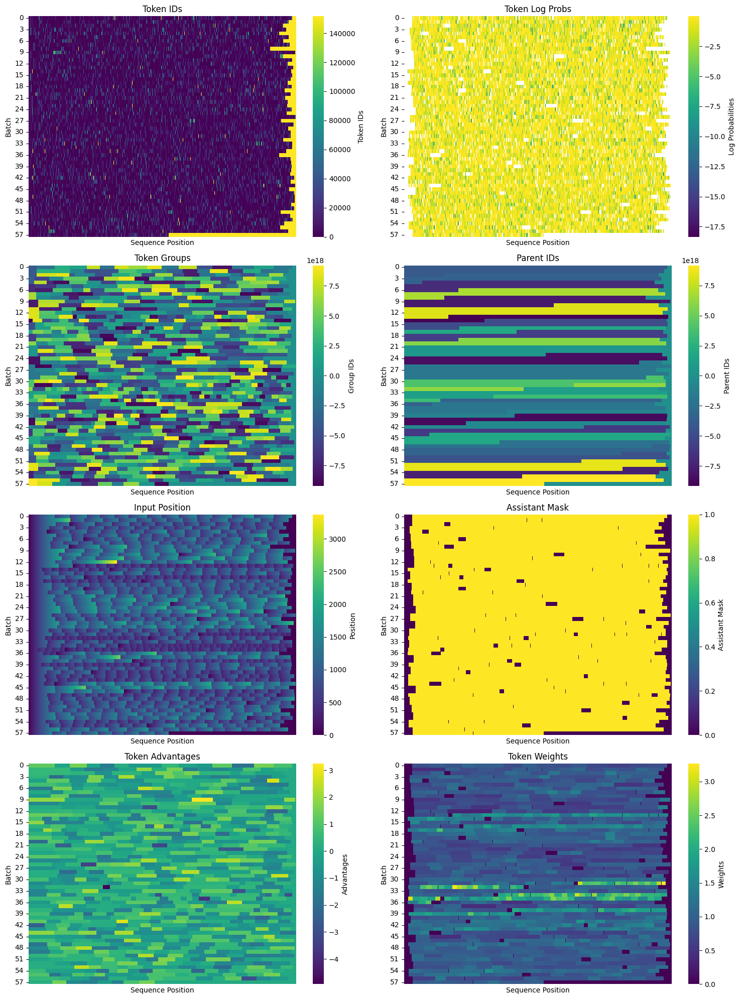

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 21:19:27.422000 80145 torch/distributed/run.py:793] 
W0221 21:19:27.422000 80145 torch/distributed/run.py:793] *****************************************
W0221 21:19:27.422000 80145 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 21:19:27.422000 80145 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0022
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740172772.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.51 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|14|Loss: -0.0001: 100%|██████████| 14/14 [08:40<00:00, 35.83s/it, entropy=0.593, kl_div=nan, loss=-5.71e-5, policy=-5.71e-5]INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.85 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB sa

Saved iteration #23 model files to ./models/031/0023
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0023 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0023 --port=8000 --api-key=default
INFO 02-21 21:29:39 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 21:29:40 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 21:29:40 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0023', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.50s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.58s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.63s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.64s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.60s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.62s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.63s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.12s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.42s/it]



(VllmWorkerProcess pid=82857) INFO 02-21 21:30:14 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 21:30:14 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=82857) INFO 02-21 21:30:17 worker.py:267] Memory profiling takes 2.28 seconds
(VllmWorkerProcess pid=82857) INFO 02-21 21:30:17 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=82857) INFO 02-21 21:30:17 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 21:30:17 worker.py:267] Memory profiling takes 2.54 seconds
INFO 02-21 21:30:17 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 21:30:17 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [82572]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 21:31:04 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:52518 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:18<00:00,  1.41s/it, completion_tokens=807, prompt_tokens=425, reward=0.577, token_logprobs=826405]
Deleted iteration directory ./models/031/0021


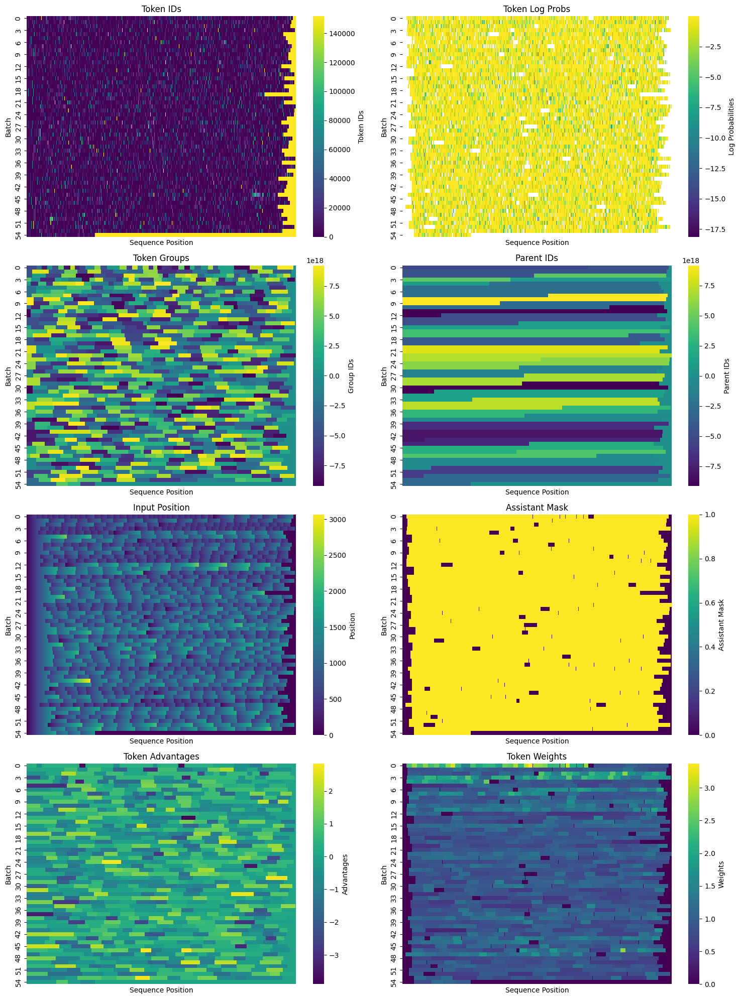

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 21:33:45.343000 83544 torch/distributed/run.py:793] 
W0221 21:33:45.343000 83544 torch/distributed/run.py:793] *****************************************
W0221 21:33:45.343000 83544 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 21:33:45.343000 83544 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0023
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740173630.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.44 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|14|Loss: -0.0017: 100%|██████████| 14/14 [08:40<00:00, 35.80s/it, entropy=0.735, kl_div=nan, loss=-0.00169, policy=-0.00169]  INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.82 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #24 model files to ./models/031/0024
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0024 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0024 --port=8000 --api-key=default
INFO 02-21 21:43:56 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 21:43:57 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 21:43:57 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0024', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.52s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.59s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.60s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.61s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:12<00:07,  2.57s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.58s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.59s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.07s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.38s/it]



INFO 02-21 21:44:31 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=85961) INFO 02-21 21:44:31 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=85961) INFO 02-21 21:44:34 worker.py:267] Memory profiling takes 2.24 seconds
(VllmWorkerProcess pid=85961) INFO 02-21 21:44:34 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=85961) INFO 02-21 21:44:34 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 21:44:34 worker.py:267] Memory profiling takes 2.49 seconds
INFO 02-21 21:44:34 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 21:44:34 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [85675]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 21:45:23 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:39060 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:06<00:00, 15.72it/s, completion_tokens=835, prompt_tokens=437, reward=0.571, token_logprobs=855489]
Deleted iteration directory ./models/031/0023


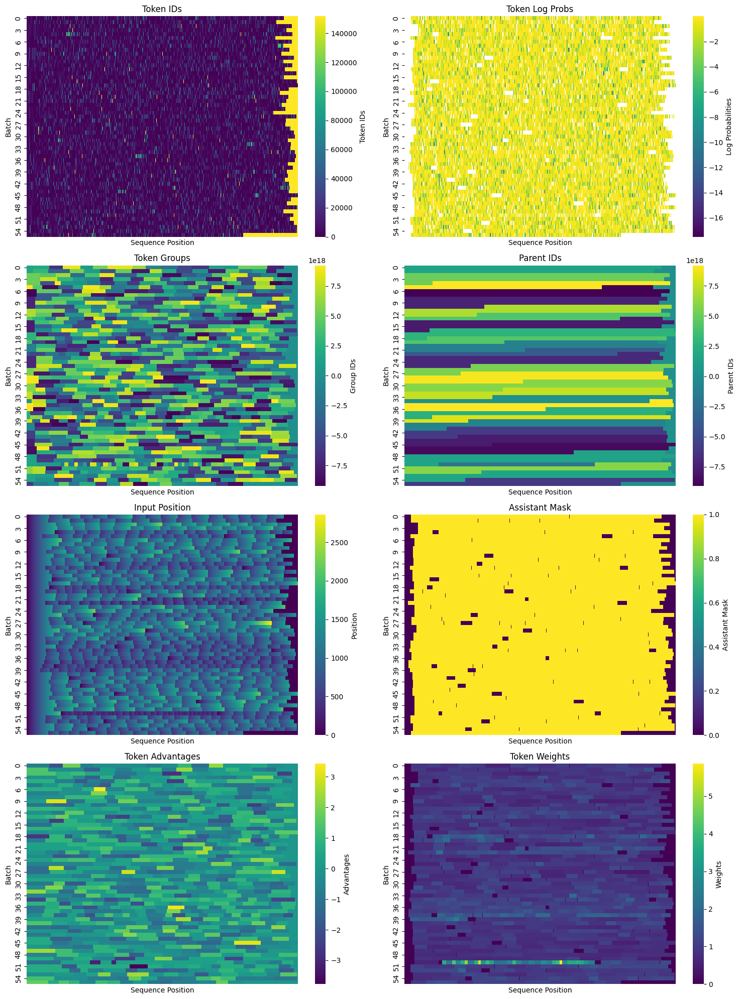

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 21:47:53.257000 86252 torch/distributed/run.py:793] 
W0221 21:47:53.257000 86252 torch/distributed/run.py:793] *****************************************
W0221 21:47:53.257000 86252 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 21:47:53.257000 86252 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0024
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740174478.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 24.91 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|14|Loss: 0.0001: 100%|██████████| 14/14 [08:40<00:00, 35.80s/it, entropy=0.715, kl_div=nan, loss=9.41e-5, policy=9.41e-5]     INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.71 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB 

Saved iteration #25 model files to ./models/031/0025
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0025 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0025 --port=8000 --api-key=default
INFO 02-21 21:58:03 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 21:58:04 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 21:58:04 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0025', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.51s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.62s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.69s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.71s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:08,  2.69s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:16<00:05,  2.68s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.68s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.15s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.47s/it]



(VllmWorkerProcess pid=88985) INFO 02-21 21:58:39 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 21:58:39 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=88985) INFO 02-21 21:58:41 worker.py:267] Memory profiling takes 2.27 seconds
(VllmWorkerProcess pid=88985) INFO 02-21 21:58:41 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=88985) INFO 02-21 21:58:41 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 21:58:41 worker.py:267] Memory profiling takes 2.36 seconds
INFO 02-21 21:58:41 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 21:58:41 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [88700]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 21:59:29 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:40738 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:14<00:00,  3.95it/s, completion_tokens=789, prompt_tokens=395, reward=0.619, token_logprobs=808257]
Deleted iteration directory ./models/031/0024


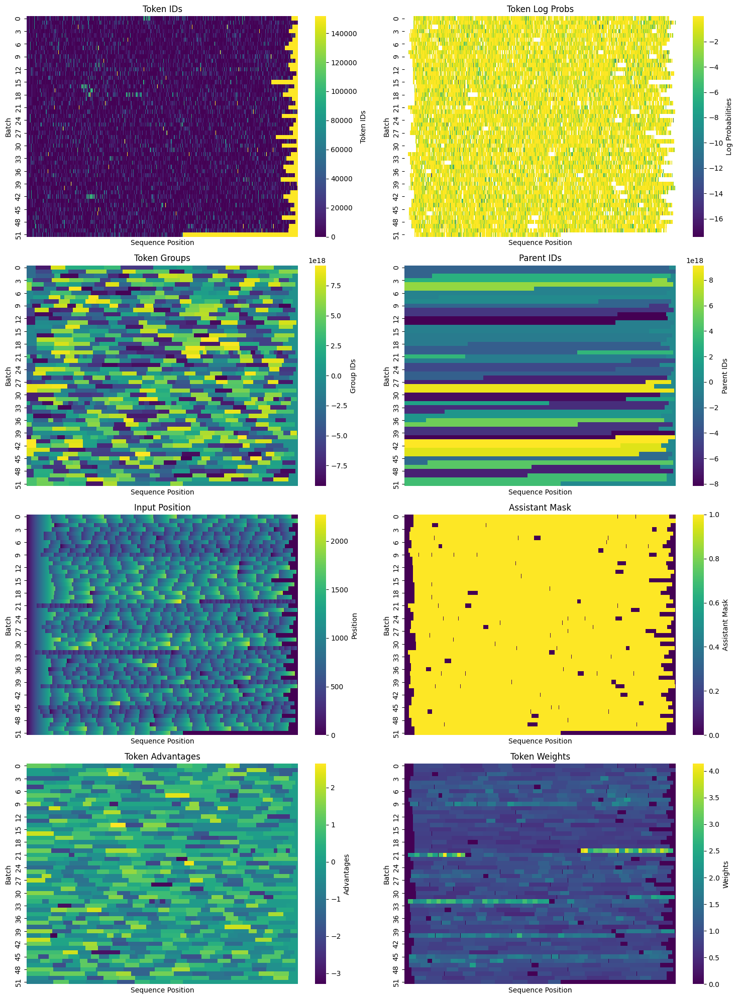

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 22:02:07.395000 89674 torch/distributed/run.py:793] 
W0221 22:02:07.395000 89674 torch/distributed/run.py:793] *****************************************
W0221 22:02:07.395000 89674 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 22:02:07.395000 89674 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0025
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_m

Writing logs to models/031/logs/log_1740175332.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 24.31 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|13|Loss: 0.0001: 100%|██████████| 13/13 [08:04<00:00, 35.83s/it, entropy=0.792, kl_div=nan, loss=5.66e-5, policy=5.66e-5]   INFO:torchtune.utils._logging:Saving checkpoint. This may take some time. Retrieving full model state dict...
INFO:torchtune.utils._logging:Getting full model state dict took 17.72 secs
INFO:torchtune.utils._logging:Model checkpoint of size 3.89 GB sa

Saved iteration #26 model files to ./models/031/0026
$ vllm serve /home/gcpuser/sky_workdir/experiments/models/031/0026 --block-size=32 --disable-log-requests --enable-prefix-caching --enforce-eager --gpu-memory-utilization=0.95 --max-model-len=16384 --max-num-seqs=1024 --max-num-batched-tokens=16384 --num-scheduler-steps=8 --preemption-mode=swap --return-tokens-as-token-ids --swap-space=80 --tensor-parallel-size=2 --served-model-name=./models/031/0026 --port=8000 --api-key=default
INFO 02-21 22:11:41 __init__.py:190] Automatically detected platform cuda.
INFO 02-21 22:11:42 api_server.py:840] vLLM API server version 0.7.2
INFO 02-21 22:11:42 api_server.py:841] args: Namespace(subparser='serve', model_tag='/home/gcpuser/sky_workdir/experiments/models/031/0026', config='', host=None, port=8000, uvicorn_log_level='info', allow_credentials=False, allowed_origins=['*'], allowed_methods=['*'], allowed_headers=['*'], api_key='default', lora_modules=None, prompt_adapters=None, chat_template=N

Loading pt checkpoint shards:   0% Completed | 0/8 [00:00<?, ?it/s]
Loading pt checkpoint shards:  12% Completed | 1/8 [00:02<00:17,  2.55s/it]
Loading pt checkpoint shards:  25% Completed | 2/8 [00:05<00:15,  2.63s/it]
Loading pt checkpoint shards:  38% Completed | 3/8 [00:07<00:13,  2.64s/it]
Loading pt checkpoint shards:  50% Completed | 4/8 [00:10<00:10,  2.66s/it]
Loading pt checkpoint shards:  62% Completed | 5/8 [00:13<00:07,  2.66s/it]
Loading pt checkpoint shards:  75% Completed | 6/8 [00:15<00:05,  2.67s/it]
Loading pt checkpoint shards:  88% Completed | 7/8 [00:18<00:02,  2.67s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.15s/it]
Loading pt checkpoint shards: 100% Completed | 8/8 [00:19<00:00,  2.45s/it]



(VllmWorkerProcess pid=92462) INFO 02-21 22:12:17 model_runner.py:1115] Loading model weights took 13.9281 GB
INFO 02-21 22:12:17 model_runner.py:1115] Loading model weights took 13.9281 GB
(VllmWorkerProcess pid=92462) INFO 02-21 22:12:19 worker.py:267] Memory profiling takes 2.28 seconds
(VllmWorkerProcess pid=92462) INFO 02-21 22:12:19 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
(VllmWorkerProcess pid=92462) INFO 02-21 22:12:19 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.57GiB; PyTorch activation peak memory takes 1.45GiB; the rest of the memory reserved for KV Cache is 58.21GiB.
INFO 02-21 22:12:20 worker.py:267] Memory profiling takes 2.38 seconds
INFO 02-21 22:12:20 worker.py:267] the current vLLM instance can use total_gpu_memory (79.11GiB) x gpu_memory_utilization (0.95) = 75.15GiB
INFO 02-21 22:12:20 worker.py:267] model weights take 13.93GiB; non_torch_memory takes 1.82GiB; Py

INFO:     Started server process [92169]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO 02-21 22:13:07 chat_utils.py:332] Detected the chat template content format to be 'string'. You can set `--chat-template-content-format` to override this.
INFO:     127.0.0.1:40980 - "POST /v1/chat/completions HTTP/1.1" 200 OK
vLLM server started succesfully. Logs can be found at ./logs/vllm.log


val:   0%|          | 0/128 [00:00<?, ?it/s]

train:   0%|          | 0/1024 [00:00<?, ?it/s]

train: 100%|██████████| 1024/1024 [02:11<00:00,  2.30s/it, completion_tokens=731, prompt_tokens=360, reward=0.652, token_logprobs=748818]
Deleted iteration directory ./models/031/0025


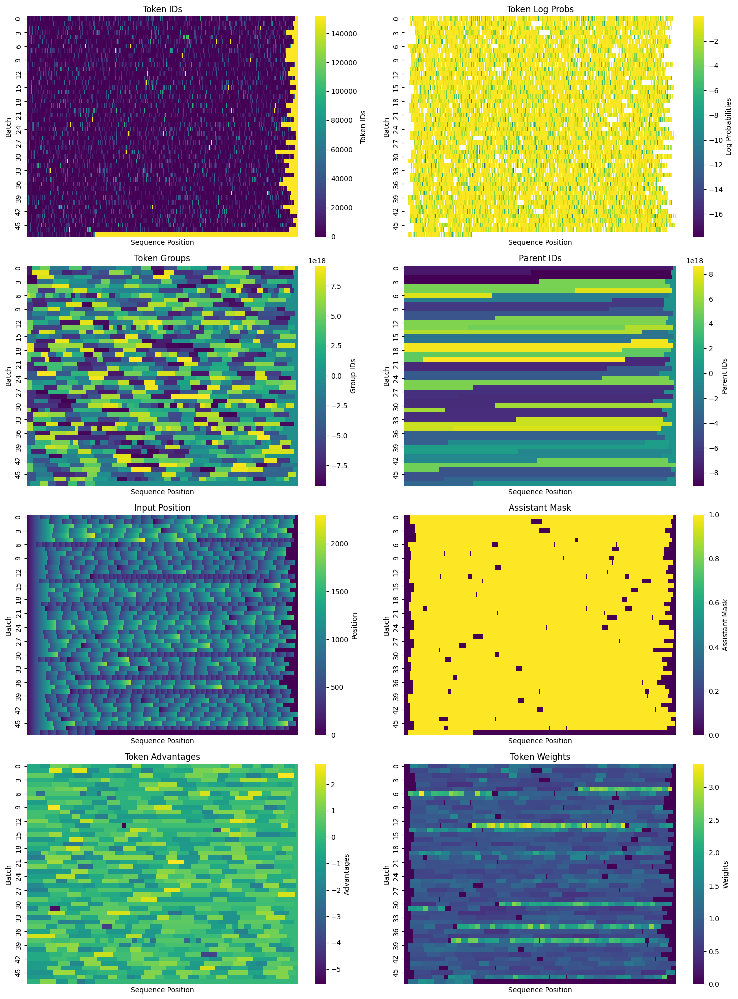

rsyncing /dev/shm/models/031 to /dev/shm/models/031
$ tune run --nproc-per-node=2 lib.recipe.TuneRecipe --config ./models/031/config.yaml
Running with torchrun...


W0221 22:15:41.333000 92724 torch/distributed/run.py:793] 
W0221 22:15:41.333000 92724 torch/distributed/run.py:793] *****************************************
W0221 22:15:41.333000 92724 torch/distributed/run.py:793] Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed. 
W0221 22:15:41.333000 92724 torch/distributed/run.py:793] *****************************************
INFO:torchtune.utils._logging:Set intra op parallelism no. of threads to 26
INFO:torchtune.utils._logging:Running FullFinetuneRecipe with resolved config:

batch_size: 2
checkpointer:
  _component_: torchtune.training.checkpointing._checkpointer.FullModelHFCheckpointer
  checkpoint_dir: ./models/031/0026
  checkpoint_files:
  - hf_model_0001.pt
  - hf_model_0002.pt
  - hf_model_0003.pt
  - hf_model_0004.pt
  - hf_model_0005.pt
  - hf_model_0006.pt
  - hf_model_0007.pt


Writing logs to models/031/logs/log_1740176146.txt


INFO:torchtune.utils._logging:FSDP is enabled. Instantiating model and loading checkpoint on Rank 0 ...
INFO:torchtune.utils._logging:Instantiating model and loading checkpoint took 25.30 secs
INFO:torchtune.utils._logging:Memory stats after model init:
	GPU peak memory allocation: 3.68 GiB
	GPU peak memory reserved: 3.75 GiB
	GPU peak memory active: 3.68 GiB
INFO:torchtune.utils._logging:Optimizer is initialized.
INFO:torchtune.utils._logging:Loss is initialized.
INFO:torchtune.utils._logging:Dataset and Sampler are initialized.
INFO:torchtune.utils._logging: Profiler config after instantiation: {'enabled': False}
1|8|Loss: -0.0000:  67%|██████▋   | 8/12 [05:05<02:25, 36.29s/it, entropy=0.677, kl_div=nan, loss=-4.31e-6, policy=-4.31e-6]  

In [ ]:
model_name = get_last_iteration_dir(output_dir) or model.base_model
for i in range(get_iteration(output_dir), num_iterations):
    vllm = await start_vllm(
        model_name,
        max_concurrent_requests=1024,
        named_arguments=dict(
            block_size=32,
            disable_log_requests=True,
            enable_prefix_caching=True,
            enforce_eager=True,
            gpu_memory_utilization=0.95,
            max_model_len=16384,
            max_num_seqs=1024,
            max_num_batched_tokens=16384,
            num_scheduler_steps=8,
            preemption_mode="swap",
            return_tokens_as_token_ids=True,
            swap_space=80,
            tensor_parallel_size=torch.cuda.device_count(),
        ),
        timeout=180 + 15 * torch.cuda.device_count(),
        verbosity=verbosity,
    )
    semaphore = asyncio.Semaphore(
        int(1.33 * vllm.max_concurrent_tokens / expected_tokens)
    )
    offset = i * stride
    val_results, train_results = await asyncio.gather(
        get_task_results(
            tasks=val_tasks,
            client=vllm.client,
            model=vllm.model,
            cache=False,
            log_results=8,
            n=2,
            params=ChatCompletionParams(
                stream_options={
                    "include_usage": True,
                }
            ),
            pbar_desc="val",
            semaphore=semaphore,
        ),
        get_task_results(
            tasks=list(islice(cycle(train_tasks), offset, offset + tasks_per_iter)),
            client=vllm.client,
            model=vllm.model,
            cache=False,
            log_results=False,
            n=samples_per_task,
            params=ChatCompletionParams(
                stream_options={
                    "include_usage": True,
                }
            ),
            pbar_desc="train",
            semaphore=semaphore,
            transform=TaskResultTokenizer(tokenizer),
        ),
    )
    vllm.process.terminate()
    kill_vllm_workers()
    val_stats = val_results.stats
    assert val_stats.grades > 0
    assert val_stats.usages > 0
    wandb_data = {
        "iteration": i,
        "exceptions": val_stats.exceptions + train_results.stats.exceptions,
        "reward": val_stats.total_reward / val_stats.grades,
        "tokens": round(val_stats.completion_tokens / val_stats.usages),
    }
    try:
        wandb_data.update(
            pl.DataFrame(last_tune_log(output_dir)).drop("step").mean().to_dicts()[0]
        )
    except Exception:
        pass
    wandb.log(wandb_data)
    expected_tokens = wandb_data["tokens"]
    try:
        best_iteration = (
            wandb.Api()
            .run(f"{run.entity}/{run.project}/{run.id}")
            .history()
            .sort_values(by="reward")["iteration"]
            .iloc[-1]
        )
        clear_iteration_dirs(output_dir, [best_iteration, i])
    except Exception:
        pass
    # see ./logs/rsync.log for output
    asyncio.create_task(rsync_dir(sync_dir, "gs://atreides/openpipe/"))
    tokenized_results = [
        result
        for results in train_results
        for result in results
        if result.advantage != 0
    ]
    packed_tensors = packed_tensors_from_tokenized_results(
        tokenized_results,
        seq_len=seq_len,
        pad_token_id=tokenizer.pad_token_id,  # type: ignore
    )
    if verbosity == 2:
        plot_packed_tensors(packed_tensors)
    else:
        print(f"Packed tensors into {packed_tensors["tokens"].size()} shape")
    optimizer_config = ComponentConfig(
        model.tune_optimizer,
        lr=lr,
        betas=betas,
        weight_decay=weight_decay,
    )
    if model.tune_optimizer == "torch.optim.AdamW":
        optimizer_config.fused = True
    model_name = await tune(
        base_model=model.base_model,
        output_dir=output_dir,
        packed_tensors=packed_tensors,
        model=model.tune_model,
        model_type=model.tune_model_type,
        config=TuneRecipeConfig(
            optimizer=optimizer_config,
            loss=ComponentConfig(
                GRPO,
                clip_epsilon=clip_epsilon,
                entropy_coef=entropy_coef,
                kl_coef=kl_coef,
                tanh=tanh,
            ),
            shuffle=True,
            batch_size=model.tune_max_batch_tokens // seq_len,
            fsdp_cpu_offload=model.tune_fsdp_cpu_offload,
            enable_activation_checkpointing=True,
            enable_activation_offloading=True,
            custom_sharded_layers=["tok_embeddings", "output"],
            num_output_chunks=2,
        ),
        verbosity=verbosity,
    )
wandb.finish()